In [1]:
#import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from datetime import datetime, date


from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


1. Product performance - grouped by cat_id
2. State performance - grouped by state_id
3. State performance by stores - grouped by state_id and store_id
4. Product performance by state, by stores 
5. Annual Sales trend
6. Monthly Sales trend
7. 28 days Sales trend

In [2]:
# Load sales data
sv = pd.read_csv('sales_train_validation.csv')

In [3]:
# Load calendar data
cal = pd.read_excel('cal_det.xlsx',index_col=0)

In [4]:
cal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1969 entries, d_1 to d_1969
Data columns (total 27 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          1969 non-null   object
 1   wm_yr_wk      1969 non-null   int64 
 2   weekday       1969 non-null   object
 3   wday          1969 non-null   int64 
 4   month         1969 non-null   int64 
 5   year          1969 non-null   int64 
 6   event_name_1  1969 non-null   object
 7   event_type_1  1969 non-null   object
 8   event_name_2  1969 non-null   object
 9   event_type_2  1969 non-null   object
 10  snap_CA       1969 non-null   int64 
 11  snap_TX       1969 non-null   int64 
 12  snap_WI       1969 non-null   int64 
 13  yrmth         1969 non-null   object
 14  event1        1969 non-null   int64 
 15  event2        1969 non-null   int64 
 16  events        1969 non-null   int64 
 17  is_eventR     1969 non-null   int64 
 18  is_eventN     1969 non-null   int64 
 19  is_even

In [5]:
cal[(cal['month']==12) & (cal['year']==2015)]

,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,...,is_eventR,is_eventN,is_eventC,is_eventS,Xmas,TG,NY,LD,SB,eve
int_day,,,,,,,,,,,,,,,,,,,,,
d_1768,2015-12-01,11544,Tuesday,4,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0
d_1769,2015-12-02,11544,Wednesday,5,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0
d_1770,2015-12-03,11544,Thursday,6,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0
d_1771,2015-12-04,11544,Friday,7,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0
d_1772,2015-12-05,11545,Saturday,1,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0
d_1773,2015-12-06,11545,Sunday,2,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0
d_1774,2015-12-07,11545,Monday,3,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0
d_1775,2015-12-08,11545,Tuesday,4,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0
d_1776,2015-12-09,11545,Wednesday,5,12,2015,nil,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,0


In [6]:
sv.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


# Sales vs Events

In [7]:
sv_state_tmp1 = sv.groupby('state_id').sum().T
sv_state_tmp1

state_id,CA,TX,WI
d_1,14195,9438,8998
d_2,13805,9630,8314
d_3,10108,6778,6897
d_4,11047,7381,6984
d_5,9925,5912,3309
...,...,...,...
d_1909,15148,9600,10595
d_1910,14488,9602,10943
d_1911,17095,10615,12807
d_1912,21834,12266,14862


In [8]:
sv_state_tmp1.reset_index(inplace=True)
sv_state_tmp1

state_id,index,CA,TX,WI
0,d_1,14195,9438,8998
1,d_2,13805,9630,8314
2,d_3,10108,6778,6897
3,d_4,11047,7381,6984
4,d_5,9925,5912,3309
...,...,...,...,...
1908,d_1909,15148,9600,10595
1909,d_1910,14488,9602,10943
1910,d_1911,17095,10615,12807
1911,d_1912,21834,12266,14862


In [9]:
sv_state_tmp1.rename(columns={'index':'int_day'}, inplace = True)
sv_state_tmp1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1913 entries, 0 to 1912
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   int_day  1913 non-null   object
 1   CA       1913 non-null   int64 
 2   TX       1913 non-null   int64 
 3   WI       1913 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 59.9+ KB


In [10]:
sv_state_tmp1.index

RangeIndex(start=0, stop=1913, step=1)

In [11]:
sv_state_cal = sv_state_tmp1.join(cal, on = 'int_day')
sv_state_cal

,int_day,CA,TX,WI,date,wm_yr_wk,weekday,wday,month,year,...,is_eventR,is_eventN,is_eventC,is_eventS,Xmas,TG,NY,LD,SB,eve
0,d_1,14195,9438,8998,2011-01-29,11101,Saturday,1,1,2011,...,0,0,0,0,0,0,0,0,0,0
1,d_2,13805,9630,8314,2011-01-30,11101,Sunday,2,1,2011,...,0,0,0,0,0,0,0,0,0,0
2,d_3,10108,6778,6897,2011-01-31,11101,Monday,3,1,2011,...,0,0,0,0,0,0,0,0,0,0
3,d_4,11047,7381,6984,2011-02-01,11101,Tuesday,4,2,2011,...,0,0,0,0,0,0,0,0,0,0
4,d_5,9925,5912,3309,2011-02-02,11101,Wednesday,5,2,2011,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1908,d_1909,15148,9600,10595,2016-04-20,11612,Wednesday,5,4,2016,...,0,0,0,0,0,0,0,0,0,0
1909,d_1910,14488,9602,10943,2016-04-21,11612,Thursday,6,4,2016,...,0,0,0,0,0,0,0,0,0,0
1910,d_1911,17095,10615,12807,2016-04-22,11612,Friday,7,4,2016,...,0,0,0,0,0,0,0,0,0,0
1911,d_1912,21834,12266,14862,2016-04-23,11613,Saturday,1,4,2016,...,0,0,0,0,0,0,0,0,0,0


In [12]:
sv_state_cal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1913 entries, 0 to 1912
Data columns (total 31 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   int_day       1913 non-null   object
 1   CA            1913 non-null   int64 
 2   TX            1913 non-null   int64 
 3   WI            1913 non-null   int64 
 4   date          1913 non-null   object
 5   wm_yr_wk      1913 non-null   int64 
 6   weekday       1913 non-null   object
 7   wday          1913 non-null   int64 
 8   month         1913 non-null   int64 
 9   year          1913 non-null   int64 
 10  event_name_1  1913 non-null   object
 11  event_type_1  1913 non-null   object
 12  event_name_2  1913 non-null   object
 13  event_type_2  1913 non-null   object
 14  snap_CA       1913 non-null   int64 
 15  snap_TX       1913 non-null   int64 
 16  snap_WI       1913 non-null   int64 
 17  yrmth         1913 non-null   object
 18  event1        1913 non-null   int64 
 19  event2

In [13]:
sv_state_cal['event_name_1'].unique()

array(['nil', 'SuperBowl', 'ValentinesDay', 'PresidentsDay', 'LentStart',
       'LentWeek2', 'StPatricksDay', 'Purim End', 'OrthodoxEaster',
       'Pesach End', 'Cinco De Mayo', "Mother's day", 'MemorialDay',
       'NBAFinalsStart', 'NBAFinalsEnd', "Father's day",
       'IndependenceDay', 'Ramadan starts', 'Eid al-Fitr', 'LaborDay',
       'ColumbusDay', 'Halloween', 'EidAlAdha', 'VeteransDay',
       'Thanksgiving', 'Thanksgiving_Oth', 'Christmas', 'Chanukah End',
       'NewYear', 'OrthodoxChristmas', 'MartinLutherKingDay', 'Easter'],
      dtype=object)

In [25]:
tmp=sv_state_cal.groupby('snap_CA')['CA'].mean()
print(tmp)
print('Snap mean sales is ', tmp[1]/(tmp[0]+tmp[1])*100, 'total mean sales')
print('Snap mean sales is higher than non-Snap mean sales by ', (tmp[1]/(tmp[0])-1)*100, '%')

snap_CA
0    14605.813718
1    15771.885714
Name: CA, dtype: float64
Snap mean sales is  51.91928950880891 total mean sales
Snap mean sales is higher than non-Snap mean sales by  7.98361542165873 %


In [26]:
tmp = sv_state_cal.groupby('snap_TX')['TX'].mean()
print(tmp)
print('Snap mean sales is ', tmp[1]/(tmp[0]+tmp[1])*100, 'total mean sales')
print('Snap mean sales is higher than non-Snap mean sales by ', (tmp[1]/(tmp[0])-1)*100, '%')



snap_TX
0     9519.082619
1    10612.734921
Name: TX, dtype: float64
Snap mean sales is  52.716228427034025 total mean sales
Snap mean sales is higher than non-Snap mean sales by  11.489051472311097 %


In [27]:
tmp=sv_state_cal.groupby('snap_WI')['WI'].mean()
print(tmp)
print('Snap mean sales is ', tmp[1]/(tmp[0]+tmp[1])*100, 'total mean sales')
print('Snap mean sales is higher than non-Snap mean sales by ', (tmp[1]/(tmp[0])-1)*100, '%')


snap_WI
0     8838.505066
1    10763.577778
Name: WI, dtype: float64
Snap mean sales is  54.91037796045543 total mean sales
Snap mean sales is higher than non-Snap mean sales by  21.780523935857875 %


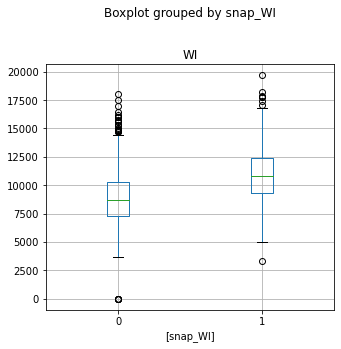

In [199]:
bp1 = sv_state_cal.boxplot(column=['WI'],by=['snap_WI'],
                                                            figsize=[5,10], layout=(2,1), rot=True)

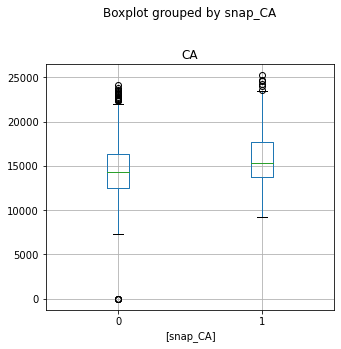

In [200]:
bp1 = sv_state_cal.boxplot(column=['CA'],by=['snap_CA'],
                                                            figsize=[5,10], layout=(2,1), rot=True)

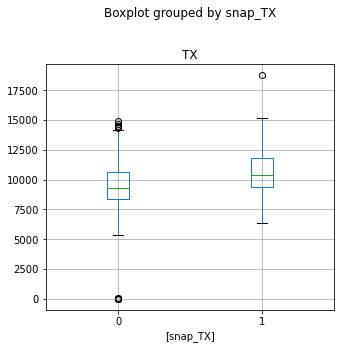

In [201]:
bp1 = sv_state_cal.boxplot(column=['TX'],by=['snap_TX'],
                                                            figsize=[5,10], layout=(2,1), rot=True)

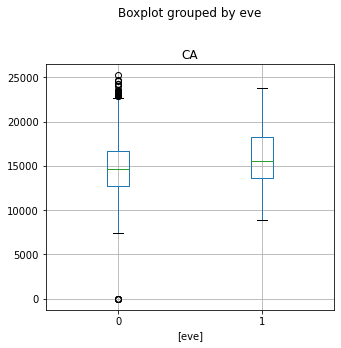

In [209]:
bp1 = sv_state_cal.boxplot(column=['CA'],by=['eve'],
                                                            figsize=[5,10], layout=(2,1), rot=True)

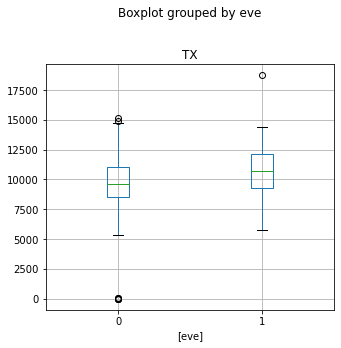

In [210]:
bp1 = sv_state_cal.boxplot(column=['TX'],by=['eve'],
                                                            figsize=[5,10], layout=(2,1), rot=True)

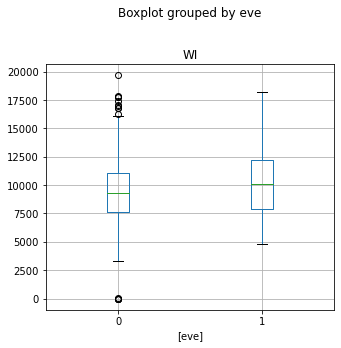

In [211]:
bp1 = sv_state_cal.boxplot(column=['WI'],by=['eve'],
                                                            figsize=[5,10], layout=(2,1), rot=True)

In [70]:
sv_state_cal['sales'] = sv_state_cal['CA']+sv_state_cal['TX']+sv_state_cal['WI']

In [71]:
sv_state_cal.iloc[0]

int_day                d_1
CA                   14195
TX                    9438
WI                    8998
date            2011-01-29
wm_yr_wk             11101
weekday           Saturday
wday                     1
month                    1
year                  2011
event_name_1           nil
event_type_1           nil
event_name_2           nil
event_type_2           nil
snap_CA                  0
snap_TX                  0
snap_WI                  0
yrmth              2011-01
event1                   0
event2                   0
events                   0
is_eventR                0
is_eventN                0
is_eventC                0
is_eventS                0
Xmas                     0
TG                       0
NY                       0
LD                       0
SB                       0
eve                      0
sales                32631
Name: 0, dtype: object

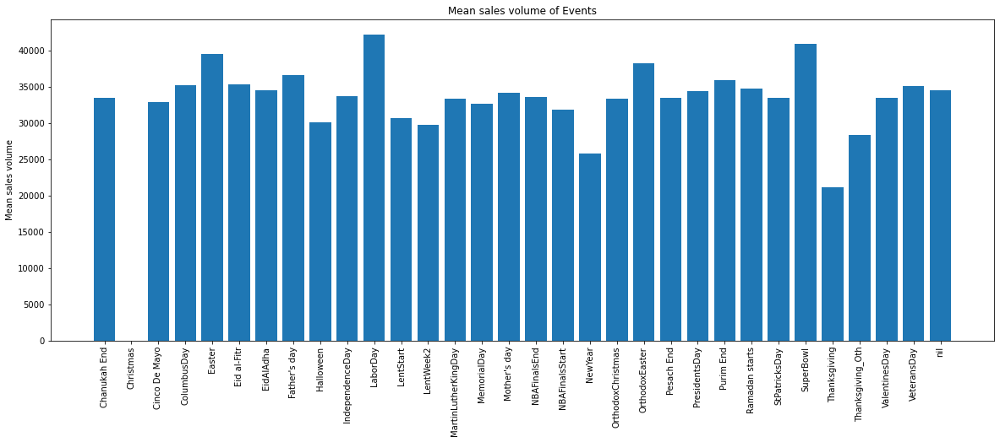

In [204]:
y = sv_state_cal.groupby('event_name_1')['sales'].mean()
x = np.sort(sv_state_cal.event_name_1.unique())


plt.figure(figsize=(20, 7))
plt.bar(x,y)
plt.xticks(rotation=90)
plt.ylabel("Mean sales volume")
plt.title("Mean sales volume of Events")
plt.show()

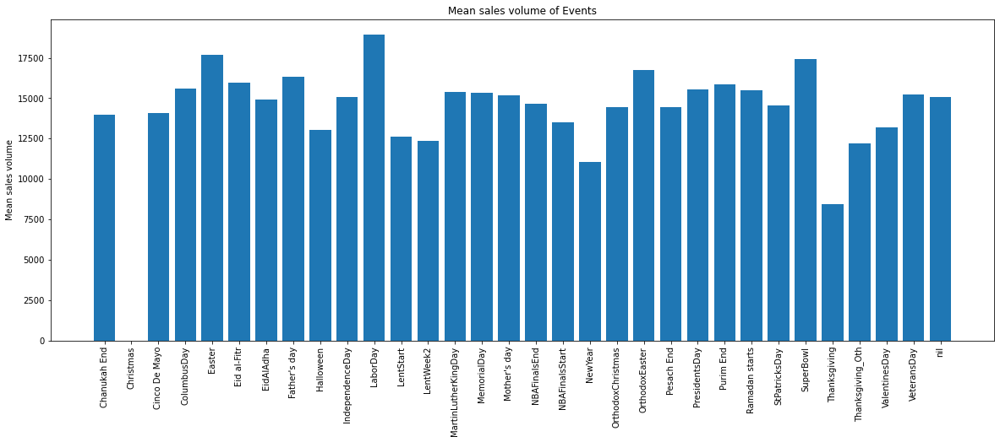

In [205]:
y = sv_state_cal.groupby(by =['event_name_1'])['CA'].mean()
x = np.sort(sv_state_cal.event_name_1.unique())


plt.figure(figsize=(20, 7))
plt.bar(x,y)
plt.xticks(rotation=90)
plt.ylabel("Mean sales volume")
plt.title("Mean sales volume of Events")
plt.show()

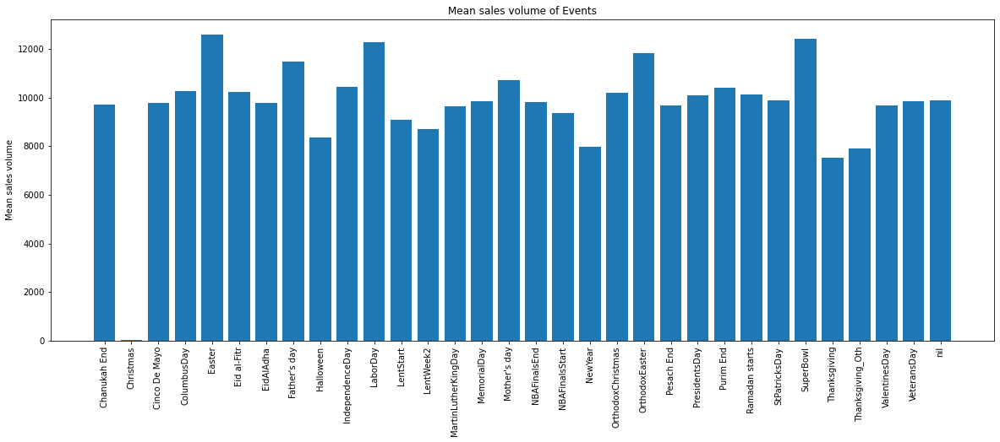

In [206]:
y = sv_state_cal.groupby(by =['event_name_1'])['TX'].mean()
x = np.sort(sv_state_cal.event_name_1.unique())


plt.figure(figsize=(20, 7))
plt.bar(x,y)
plt.xticks(rotation=90)
plt.ylabel("Mean sales volume")
plt.title("Mean sales volume of Events")
plt.show()

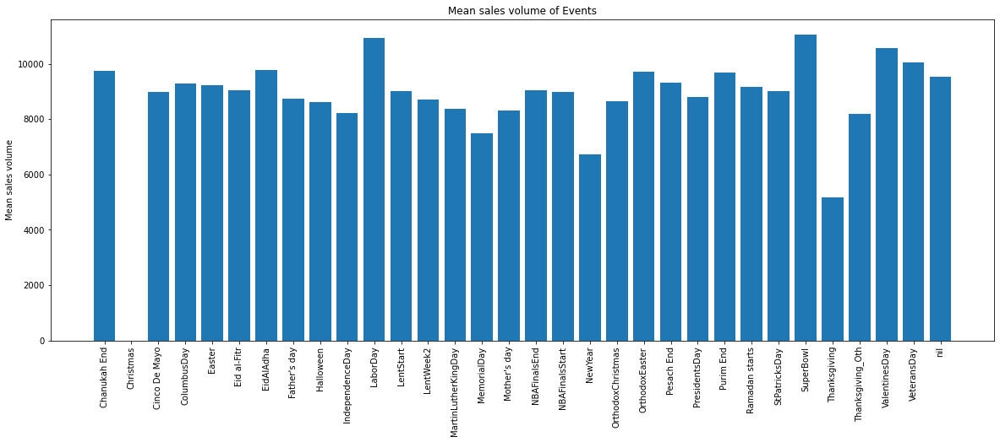

In [207]:
y = sv_state_cal.groupby(by =['event_name_1'])['WI'].mean()
x = np.sort(sv_state_cal.event_name_1.unique())


plt.figure(figsize=(20, 7))
plt.bar(x,y)
plt.xticks(rotation=90)
plt.ylabel("Mean sales volume")
plt.title("Mean sales volume of Events")
plt.show()

In [72]:
event_sales = sv_state_cal.groupby('event_name_1').mean().filter(items=['CA','TX','WI', 'sales'])

In [73]:
event_sales

,CA,TX,WI,sales
event_name_1,,,,
Chanukah End,13961.400000,9726.800000,9738.600000,33426.800000
Christmas,6.200000,6.800000,2.600000,15.600000
Cinco De Mayo,14067.000000,9778.000000,8978.500000,32823.500000
ColumbusDay,15605.400000,10276.800000,9282.600000,35164.800000
Easter,17712.200000,12590.800000,9214.600000,39517.600000
Eid al-Fitr,15968.800000,10249.400000,9049.400000,35267.600000
EidAlAdha,14936.200000,9785.600000,9782.200000,34504.000000
Father's day,16319.000000,11500.250000,8742.750000,36562.000000
Halloween,13059.400000,8370.600000,8629.400000,30059.400000


In [74]:
eve_sales = sv_state_cal.groupby('eve').mean().filter(items=['CA','TX','WI', 'sales'])
eve_sales

,CA,TX,WI,sales
eve,,,,
0,14906.796380,9809.411765,9407.609163,34123.817308
1,16002.282759,10730.800000,10263.468966,36996.551724


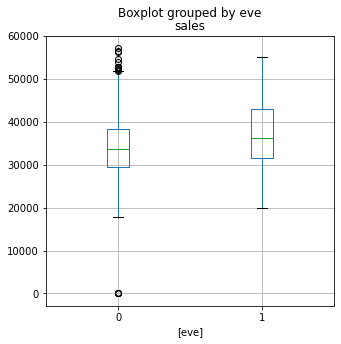

In [76]:
bp1 = sv_state_cal.boxplot(column=['sales'],by=['eve'],
                                                            figsize=[5,5], layout=(1,1), rot=True)

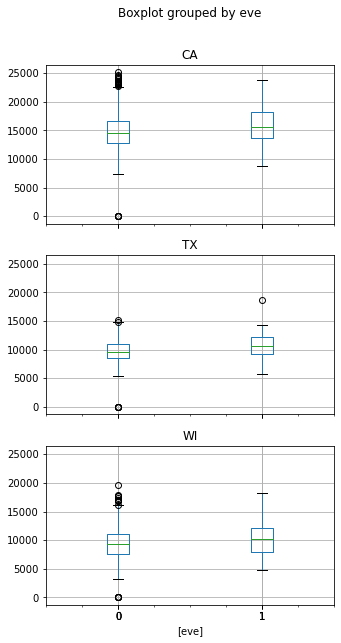

In [30]:
bp1 = sv_state_cal.boxplot(column=['CA','TX','WI'],by=['eve'],
                                                            figsize=[5,10], layout=(3,1), rot=True)

## Store and Events

In [31]:
sv_store_tmp1 = sv.groupby('store_id').sum().T
sv_store_tmp1

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
d_1,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038
d_2,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198
d_3,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317
d_4,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211
d_5,2630,1942,3817,1536,1694,2492,1726,2,1175,2132
...,...,...,...,...,...,...,...,...,...,...
d_1909,3722,3691,5235,2500,2901,3384,3315,3242,4194,3159
d_1910,3709,3303,5018,2458,2776,3446,3380,3324,4393,3226
d_1911,4387,4457,5623,2628,3022,3902,3691,3991,4988,3828
d_1912,5577,5884,7419,2954,3700,4483,4083,4772,5404,4686


In [32]:
sv_store_tmp1.reset_index(inplace=True)
sv_store_tmp1

store_id,index,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
0,d_1,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038
1,d_2,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198
2,d_3,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317
3,d_4,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211
4,d_5,2630,1942,3817,1536,1694,2492,1726,2,1175,2132
...,...,...,...,...,...,...,...,...,...,...,...
1908,d_1909,3722,3691,5235,2500,2901,3384,3315,3242,4194,3159
1909,d_1910,3709,3303,5018,2458,2776,3446,3380,3324,4393,3226
1910,d_1911,4387,4457,5623,2628,3022,3902,3691,3991,4988,3828
1911,d_1912,5577,5884,7419,2954,3700,4483,4083,4772,5404,4686


In [33]:
sv_store_tmp1.rename(columns={'index':'int_day'}, inplace = True)
sv_store_tmp1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1913 entries, 0 to 1912
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   int_day  1913 non-null   object
 1   CA_1     1913 non-null   int64 
 2   CA_2     1913 non-null   int64 
 3   CA_3     1913 non-null   int64 
 4   CA_4     1913 non-null   int64 
 5   TX_1     1913 non-null   int64 
 6   TX_2     1913 non-null   int64 
 7   TX_3     1913 non-null   int64 
 8   WI_1     1913 non-null   int64 
 9   WI_2     1913 non-null   int64 
 10  WI_3     1913 non-null   int64 
dtypes: int64(10), object(1)
memory usage: 164.5+ KB


In [34]:
sv_store_tmp1.index

RangeIndex(start=0, stop=1913, step=1)

In [35]:
sv_store_cal = sv_store_tmp1.join(cal, on = 'int_day')
sv_store_cal

,int_day,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,...,is_eventR,is_eventN,is_eventC,is_eventS,Xmas,TG,NY,LD,SB,eve
0,d_1,4337,3494,4739,1625,2556,3852,3030,2704,2256,...,0,0,0,0,0,0,0,0,0,0
1,d_2,4155,3046,4827,1777,2687,3937,3006,2194,1922,...,0,0,0,0,0,0,0,0,0,0
2,d_3,2816,2121,3785,1386,1822,2731,2225,1562,2018,...,0,0,0,0,0,0,0,0,0,0
3,d_4,3051,2324,4232,1440,2258,2954,2169,1251,2522,...,0,0,0,0,0,0,0,0,0,0
4,d_5,2630,1942,3817,1536,1694,2492,1726,2,1175,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1908,d_1909,3722,3691,5235,2500,2901,3384,3315,3242,4194,...,0,0,0,0,0,0,0,0,0,0
1909,d_1910,3709,3303,5018,2458,2776,3446,3380,3324,4393,...,0,0,0,0,0,0,0,0,0,0
1910,d_1911,4387,4457,5623,2628,3022,3902,3691,3991,4988,...,0,0,0,0,0,0,0,0,0,0
1911,d_1912,5577,5884,7419,2954,3700,4483,4083,4772,5404,...,0,0,0,0,0,0,0,0,0,0


In [36]:
sv_store_cal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1913 entries, 0 to 1912
Data columns (total 38 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   int_day       1913 non-null   object
 1   CA_1          1913 non-null   int64 
 2   CA_2          1913 non-null   int64 
 3   CA_3          1913 non-null   int64 
 4   CA_4          1913 non-null   int64 
 5   TX_1          1913 non-null   int64 
 6   TX_2          1913 non-null   int64 
 7   TX_3          1913 non-null   int64 
 8   WI_1          1913 non-null   int64 
 9   WI_2          1913 non-null   int64 
 10  WI_3          1913 non-null   int64 
 11  date          1913 non-null   object
 12  wm_yr_wk      1913 non-null   int64 
 13  weekday       1913 non-null   object
 14  wday          1913 non-null   int64 
 15  month         1913 non-null   int64 
 16  year          1913 non-null   int64 
 17  event_name_1  1913 non-null   object
 18  event_type_1  1913 non-null   object
 19  event_

In [37]:
sv_store_cal['event_name_1'].unique()

array(['nil', 'SuperBowl', 'ValentinesDay', 'PresidentsDay', 'LentStart',
       'LentWeek2', 'StPatricksDay', 'Purim End', 'OrthodoxEaster',
       'Pesach End', 'Cinco De Mayo', "Mother's day", 'MemorialDay',
       'NBAFinalsStart', 'NBAFinalsEnd', "Father's day",
       'IndependenceDay', 'Ramadan starts', 'Eid al-Fitr', 'LaborDay',
       'ColumbusDay', 'Halloween', 'EidAlAdha', 'VeteransDay',
       'Thanksgiving', 'Thanksgiving_Oth', 'Christmas', 'Chanukah End',
       'NewYear', 'OrthodoxChristmas', 'MartinLutherKingDay', 'Easter'],
      dtype=object)

In [38]:
tmp=sv_store_cal.groupby('snap_CA')['CA_1'].mean()
print(tmp)
print('Snap mean sales is ', tmp[1]/(tmp[0]+tmp[1])*100, 'total mean sales')
print('Snap mean sales is higher than non-Snap mean sales by ', (tmp[1]/(tmp[0])-1)*100, '%')

snap_CA
0    3897.100546
1    4282.914286
Name: CA_1, dtype: float64
Snap mean sales is  52.358270419273886 total mean sales
Snap mean sales is higher than non-Snap mean sales by  9.900020171509262 %


In [40]:
sv_store_cal.groupby('snap_CA')['CA_1','CA_2','CA_3','CA_4'].mean()


C:\Users\danie\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,CA_1,CA_2,CA_3,CA_4
snap_CA,,,,
0,3897.100546,2949.489478,5646.379579,2112.844115
1,4282.914286,3017.904762,6260.119048,2210.947619


In [41]:
sv_store_cal.groupby('snap_TX')['TX_1','TX_2','TX_3'].mean()


C:\Users\danie\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,TX_1,TX_2,TX_3
snap_TX,,,
0,2807.219018,3647.197973,3064.665627
1,3164.492063,4023.855556,3424.387302


In [42]:
sv_store_cal.groupby('snap_WI')['WI_1','WI_2','WI_3'].mean()


C:\Users\danie\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,WI_1,WI_2,WI_3
snap_WI,,,
0,2649.137958,3087.545596,3101.821512
1,2778.123810,4099.509524,3885.944444


In [61]:
sv_store_cal[(sv_store_cal['snap_CA'] == 1) & (sv_store_cal['month']==1) ]['date']

337     2012-01-01
338     2012-01-02
339     2012-01-03
340     2012-01-04
341     2012-01-05
342     2012-01-06
343     2012-01-07
344     2012-01-08
345     2012-01-09
346     2012-01-10
703     2013-01-01
704     2013-01-02
705     2013-01-03
706     2013-01-04
707     2013-01-05
708     2013-01-06
709     2013-01-07
710     2013-01-08
711     2013-01-09
712     2013-01-10
1068    2014-01-01
1069    2014-01-02
1070    2014-01-03
1071    2014-01-04
1072    2014-01-05
1073    2014-01-06
1074    2014-01-07
1075    2014-01-08
1076    2014-01-09
1077    2014-01-10
1433    2015-01-01
1434    2015-01-02
1435    2015-01-03
1436    2015-01-04
1437    2015-01-05
1438    2015-01-06
1439    2015-01-07
1440    2015-01-08
1441    2015-01-09
1442    2015-01-10
1798    2016-01-01
1799    2016-01-02
1800    2016-01-03
1801    2016-01-04
1802    2016-01-05
1803    2016-01-06
1804    2016-01-07
1805    2016-01-08
1806    2016-01-09
1807    2016-01-10
Name: date, dtype: object

In [62]:
sv_store_cal[(sv_store_cal['snap_CA'] == 1) & (sv_store_cal['month']==11) ]['date']

276     2011-11-01
277     2011-11-02
278     2011-11-03
279     2011-11-04
280     2011-11-05
281     2011-11-06
282     2011-11-07
283     2011-11-08
284     2011-11-09
285     2011-11-10
642     2012-11-01
643     2012-11-02
644     2012-11-03
645     2012-11-04
646     2012-11-05
647     2012-11-06
648     2012-11-07
649     2012-11-08
650     2012-11-09
651     2012-11-10
1007    2013-11-01
1008    2013-11-02
1009    2013-11-03
1010    2013-11-04
1011    2013-11-05
1012    2013-11-06
1013    2013-11-07
1014    2013-11-08
1015    2013-11-09
1016    2013-11-10
1372    2014-11-01
1373    2014-11-02
1374    2014-11-03
1375    2014-11-04
1376    2014-11-05
1377    2014-11-06
1378    2014-11-07
1379    2014-11-08
1380    2014-11-09
1381    2014-11-10
1737    2015-11-01
1738    2015-11-02
1739    2015-11-03
1740    2015-11-04
1741    2015-11-05
1742    2015-11-06
1743    2015-11-07
1744    2015-11-08
1745    2015-11-09
1746    2015-11-10
Name: date, dtype: object

In [63]:
sv_store_cal[(sv_store_cal['snap_TX'] == 1) & (sv_store_cal['month']==1) ]['date']

337     2012-01-01
339     2012-01-03
341     2012-01-05
342     2012-01-06
343     2012-01-07
345     2012-01-09
347     2012-01-11
348     2012-01-12
349     2012-01-13
351     2012-01-15
703     2013-01-01
705     2013-01-03
707     2013-01-05
708     2013-01-06
709     2013-01-07
711     2013-01-09
713     2013-01-11
714     2013-01-12
715     2013-01-13
717     2013-01-15
1068    2014-01-01
1070    2014-01-03
1072    2014-01-05
1073    2014-01-06
1074    2014-01-07
1076    2014-01-09
1078    2014-01-11
1079    2014-01-12
1080    2014-01-13
1082    2014-01-15
1433    2015-01-01
1435    2015-01-03
1437    2015-01-05
1438    2015-01-06
1439    2015-01-07
1441    2015-01-09
1443    2015-01-11
1444    2015-01-12
1445    2015-01-13
1447    2015-01-15
1798    2016-01-01
1800    2016-01-03
1802    2016-01-05
1803    2016-01-06
1804    2016-01-07
1806    2016-01-09
1808    2016-01-11
1809    2016-01-12
1810    2016-01-13
1812    2016-01-15
Name: date, dtype: object

In [64]:
sv_store_cal[(sv_store_cal['snap_TX'] == 1) & (sv_store_cal['month']==12) ]['date']

306     2011-12-01
308     2011-12-03
310     2011-12-05
311     2011-12-06
312     2011-12-07
314     2011-12-09
316     2011-12-11
317     2011-12-12
318     2011-12-13
320     2011-12-15
672     2012-12-01
674     2012-12-03
676     2012-12-05
677     2012-12-06
678     2012-12-07
680     2012-12-09
682     2012-12-11
683     2012-12-12
684     2012-12-13
686     2012-12-15
1037    2013-12-01
1039    2013-12-03
1041    2013-12-05
1042    2013-12-06
1043    2013-12-07
1045    2013-12-09
1047    2013-12-11
1048    2013-12-12
1049    2013-12-13
1051    2013-12-15
1402    2014-12-01
1404    2014-12-03
1406    2014-12-05
1407    2014-12-06
1408    2014-12-07
1410    2014-12-09
1412    2014-12-11
1413    2014-12-12
1414    2014-12-13
1416    2014-12-15
1767    2015-12-01
1769    2015-12-03
1771    2015-12-05
1772    2015-12-06
1773    2015-12-07
1775    2015-12-09
1777    2015-12-11
1778    2015-12-12
1779    2015-12-13
1781    2015-12-15
Name: date, dtype: object

In [65]:
sv_store_cal[(sv_store_cal['snap_WI'] == 1) & (sv_store_cal['month']==1) ]['date']

338     2012-01-02
339     2012-01-03
341     2012-01-05
342     2012-01-06
344     2012-01-08
345     2012-01-09
347     2012-01-11
348     2012-01-12
350     2012-01-14
351     2012-01-15
704     2013-01-02
705     2013-01-03
707     2013-01-05
708     2013-01-06
710     2013-01-08
711     2013-01-09
713     2013-01-11
714     2013-01-12
716     2013-01-14
717     2013-01-15
1069    2014-01-02
1070    2014-01-03
1072    2014-01-05
1073    2014-01-06
1075    2014-01-08
1076    2014-01-09
1078    2014-01-11
1079    2014-01-12
1081    2014-01-14
1082    2014-01-15
1434    2015-01-02
1435    2015-01-03
1437    2015-01-05
1438    2015-01-06
1440    2015-01-08
1441    2015-01-09
1443    2015-01-11
1444    2015-01-12
1446    2015-01-14
1447    2015-01-15
1799    2016-01-02
1800    2016-01-03
1802    2016-01-05
1803    2016-01-06
1805    2016-01-08
1806    2016-01-09
1808    2016-01-11
1809    2016-01-12
1811    2016-01-14
1812    2016-01-15
Name: date, dtype: object

In [67]:
sv_store_cal[(sv_store_cal['snap_WI'] == 1) & (sv_store_cal['month']==12) ]['date']

307     2011-12-02
308     2011-12-03
310     2011-12-05
311     2011-12-06
313     2011-12-08
314     2011-12-09
316     2011-12-11
317     2011-12-12
319     2011-12-14
320     2011-12-15
673     2012-12-02
674     2012-12-03
676     2012-12-05
677     2012-12-06
679     2012-12-08
680     2012-12-09
682     2012-12-11
683     2012-12-12
685     2012-12-14
686     2012-12-15
1038    2013-12-02
1039    2013-12-03
1041    2013-12-05
1042    2013-12-06
1044    2013-12-08
1045    2013-12-09
1047    2013-12-11
1048    2013-12-12
1050    2013-12-14
1051    2013-12-15
1403    2014-12-02
1404    2014-12-03
1406    2014-12-05
1407    2014-12-06
1409    2014-12-08
1410    2014-12-09
1412    2014-12-11
1413    2014-12-12
1415    2014-12-14
1416    2014-12-15
1768    2015-12-02
1769    2015-12-03
1771    2015-12-05
1772    2015-12-06
1774    2015-12-08
1775    2015-12-09
1777    2015-12-11
1778    2015-12-12
1780    2015-12-14
1781    2015-12-15
Name: date, dtype: object

## Pdt and Events

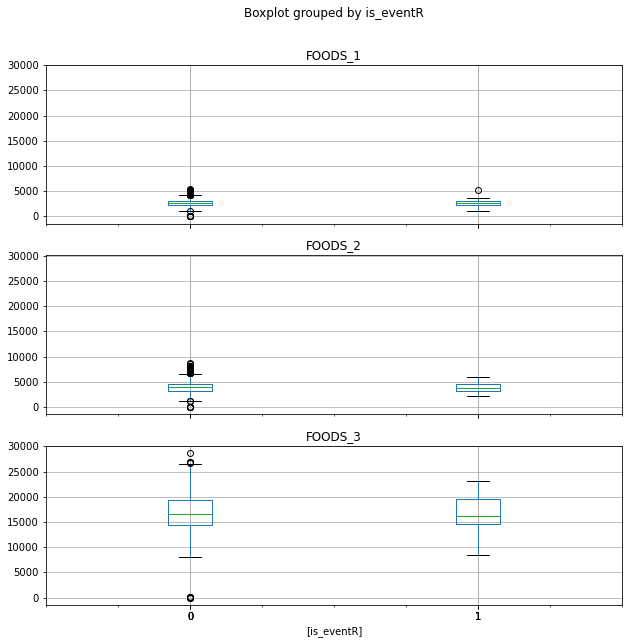

In [273]:
bp1 = sv_pdt_event.boxplot(column=['FOODS_1','FOODS_2','FOODS_3'],by=['is_eventR'],
                                                            figsize=[10,10], layout=(3,1), rot=True)

### Annual Sales Transaction dataset

In [2]:
# annual sales transaction dataset
sv_yr = pd.read_excel('sv_yr.xlsx')
sv_yr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  30490 non-null  int64 
 1   id          30490 non-null  object
 2   item_id     30490 non-null  object
 3   dept_id     30490 non-null  object
 4   cat_id      30490 non-null  object
 5   store_id    30490 non-null  object
 6   state_id    30490 non-null  object
 7   2012        30490 non-null  int64 
 8   2013        30490 non-null  int64 
 9   2014        30490 non-null  int64 
 10  2015        30490 non-null  int64 
dtypes: int64(5), object(6)
memory usage: 2.6+ MB


In [3]:
sv_yr.drop(['Unnamed: 0'], axis=1, inplace=True)

In [4]:
sv_yr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        30490 non-null  object
 1   item_id   30490 non-null  object
 2   dept_id   30490 non-null  object
 3   cat_id    30490 non-null  object
 4   store_id  30490 non-null  object
 5   state_id  30490 non-null  object
 6   2012      30490 non-null  int64 
 7   2013      30490 non-null  int64 
 8   2014      30490 non-null  int64 
 9   2015      30490 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 2.3+ MB


In [5]:
sv_CA1 = sv_yr[sv_yr['store_id'] == 'CA_1'].groupby(['item_id']).sum()


In [6]:
sv_CA1

,2012,2013,2014,2015
item_id,,,,
FOODS_1_001,402,203,266,231
FOODS_1_002,265,36,139,158
FOODS_1_003,368,299,272,254
FOODS_1_004,3052,3825,4331,4329
FOODS_1_005,538,320,226,362
...,...,...,...,...
HOUSEHOLD_2_512,304,192,219,263
HOUSEHOLD_2_513,0,172,524,226
HOUSEHOLD_2_514,162,91,90,106


In [7]:
sv_CA2 = sv_yr[sv_yr['store_id'] == 'CA_2']
sv_CA2

,id,item_id,dept_id,cat_id,store_id,state_id,2012,2013,2014,2015
3049,HOBBIES_1_001_CA_2_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_2,CA,0,85,199,177
3050,HOBBIES_1_002_CA_2_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_2,CA,88,65,46,54
3051,HOBBIES_1_003_CA_2_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_2,CA,0,0,29,58
3052,HOBBIES_1_004_CA_2_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_2,CA,1269,1425,1444,1430
3053,HOBBIES_1_005_CA_2_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_2,CA,408,408,286,386
...,...,...,...,...,...,...,...,...,...,...
6093,FOODS_3_823_CA_2_validation,FOODS_3_823,FOODS_3,FOODS,CA_2,CA,394,981,358,733
6094,FOODS_3_824_CA_2_validation,FOODS_3_824,FOODS_3,FOODS,CA_2,CA,261,115,156,27
6095,FOODS_3_825_CA_2_validation,FOODS_3_825,FOODS_3,FOODS,CA_2,CA,98,139,487,149
6096,FOODS_3_826_CA_2_validation,FOODS_3_826,FOODS_3,FOODS,CA_2,CA,0,337,328,252


##### States by annual sales volumes

In [8]:
# Rank states by annual sales volumes
sv_yr_state = sv_yr.groupby(by=['state_id']).sum()
sv_yr_state.columns

Index(['2012', '2013', '2014', '2015'], dtype='object')

<Figure size 1080x504 with 0 Axes>

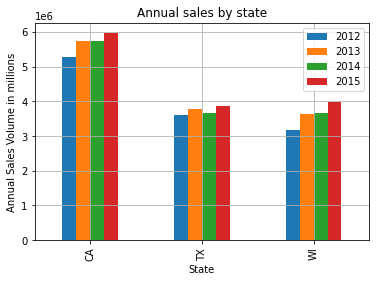

In [9]:
plt.figure(figsize=(15, 7))
sv_yr_state.plot.bar()
plt.title('Annual sales by state')
plt.legend()
plt.xlabel('State')
plt.ylabel('Annual Sales Volume in millions')
plt.grid(True)
plt.show()

##### Stores by annual sales volumes

In [10]:
# Rank stores by annual sales volumes
sv_yr_store = sv_yr.groupby(by=['store_id']).sum()
sv_yr_store.columns

Index(['2012', '2013', '2014', '2015'], dtype='object')

<Figure size 1080x504 with 0 Axes>

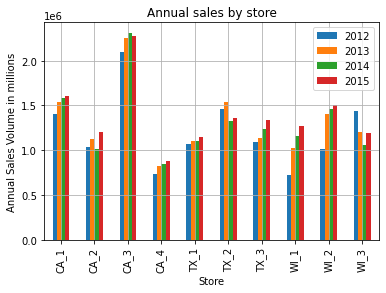

In [11]:
plt.figure(figsize=(15, 7))
sv_yr_store.plot.bar()
plt.title('Annual sales by store')
plt.legend()
plt.xlabel('Store')
plt.ylabel('Annual Sales Volume in millions')
plt.grid(True)
plt.show()

##### Annual sales volumes by Product Categories

In [12]:
# Rank products by annual sales volumes
sv_yr_products = sv_yr.groupby(by=['dept_id']).sum()
sv_yr_products.info()
sv_yr_products.columns

<class 'pandas.core.frame.DataFrame'>
Index: 7 entries, FOODS_1 to HOUSEHOLD_2
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   2012    7 non-null      int64
 1   2013    7 non-null      int64
 2   2014    7 non-null      int64
 3   2015    7 non-null      int64
dtypes: int64(4)
memory usage: 280.0+ bytes


Index(['2012', '2013', '2014', '2015'], dtype='object')

<Figure size 1080x504 with 0 Axes>

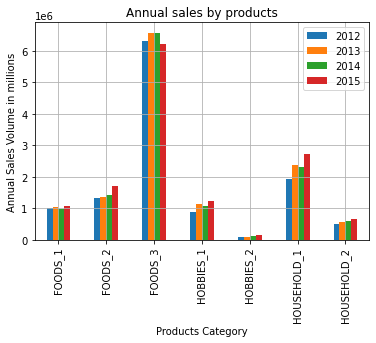

In [13]:
plt.figure(figsize=(15, 7))
sv_yr_products.plot.bar()
plt.title('Annual sales by products')
plt.legend()
plt.xlabel('Products Category')
plt.ylabel('Annual Sales Volume in millions')
plt.grid(True)
plt.show()

##### Annual sales volumes per store by product categories

In [14]:
# Rank store and products by annual sales volumes
sv_yr_store_products = sv_yr.groupby(by=['store_id', 'cat_id']).sum()
sv_yr_store_products.info()
sv_yr_store_products.columns

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 30 entries, ('CA_1', 'FOODS') to ('WI_3', 'HOUSEHOLD')
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   2012    30 non-null     int64
 1   2013    30 non-null     int64
 2   2014    30 non-null     int64
 3   2015    30 non-null     int64
dtypes: int64(4)
memory usage: 1.2+ KB


Index(['2012', '2013', '2014', '2015'], dtype='object')

In [15]:
sv_yr_store_products.tail()

2012    2013    2014    2015
store_id cat_id                                    
WI_2     HOBBIES      51765   80593   78719   87559
         HOUSEHOLD   209858  293493  301511  352226
WI_3     FOODS      1098527  879192  762958  833637
         HOBBIES      91653   86261   77547   93472
         HOUSEHOLD   247520  235856  212951  265089

<Figure size 7200x3600 with 0 Axes>

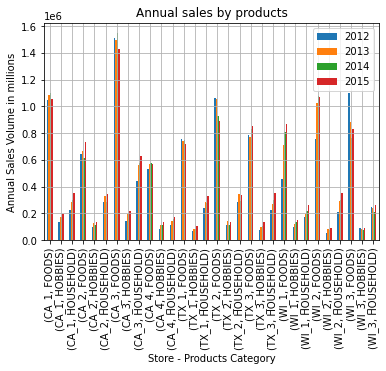

In [16]:
plt.figure(figsize=(100, 50))
sv_yr_store_products.plot.bar()
plt.title('Annual sales by products')
plt.legend()
plt.xlabel('Store - Products Category')
plt.ylabel('Annual Sales Volume in millions')
plt.grid(True)
plt.show()

In [17]:
# Rank products and store  by annual sales volumes
sv_yr_products_store = sv_yr.groupby(by=['cat_id','store_id']).sum()
sv_yr_products_store.info()
sv_yr_products_store.columns

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 30 entries, ('FOODS', 'CA_1') to ('HOUSEHOLD', 'WI_3')
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   2012    30 non-null     int64
 1   2013    30 non-null     int64
 2   2014    30 non-null     int64
 3   2015    30 non-null     int64
dtypes: int64(4)
memory usage: 1.2+ KB


Index(['2012', '2013', '2014', '2015'], dtype='object')

In [18]:
sales_vol = sv_yr_products_store.values/1000000


In [19]:
category = sv_yr_products_store.index
#category

MultiIndex([(    'FOODS', 'CA_1'),
            (    'FOODS', 'CA_2'),
            (    'FOODS', 'CA_3'),
            (    'FOODS', 'CA_4'),
            (    'FOODS', 'TX_1'),
            (    'FOODS', 'TX_2'),
            (    'FOODS', 'TX_3'),
            (    'FOODS', 'WI_1'),
            (    'FOODS', 'WI_2'),
            (    'FOODS', 'WI_3'),
            (  'HOBBIES', 'CA_1'),
            (  'HOBBIES', 'CA_2'),
            (  'HOBBIES', 'CA_3'),
            (  'HOBBIES', 'CA_4'),
            (  'HOBBIES', 'TX_1'),
            (  'HOBBIES', 'TX_2'),
            (  'HOBBIES', 'TX_3'),
            (  'HOBBIES', 'WI_1'),
            (  'HOBBIES', 'WI_2'),
            (  'HOBBIES', 'WI_3'),
            ('HOUSEHOLD', 'CA_1'),
            ('HOUSEHOLD', 'CA_2'),
            ('HOUSEHOLD', 'CA_3'),
            ('HOUSEHOLD', 'CA_4'),
            ('HOUSEHOLD', 'TX_1'),
            ('HOUSEHOLD', 'TX_2'),
            ('HOUSEHOLD', 'TX_3'),
            ('HOUSEHOLD', 'WI_1'),
            ('HOUSEH

<Figure size 1440x504 with 0 Axes>

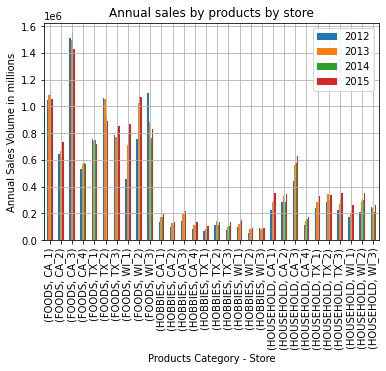

In [20]:
plt.figure(figsize=(20, 7))
sv_yr_products_store.plot.bar()
plt.title('Annual sales by products by store')
plt.legend()
plt.xlabel('Products Category - Store')
plt.ylabel('Annual Sales Volume in millions')
plt.grid(True)
plt.show()

In [21]:
#sv_yr_products_store

In [22]:
#sv_yr_products_store.index.get_level_values(1)

In [23]:
#sv_yr_products_store.index.get_level_values(0)

In [24]:
#sv_yr_products_store.swaplevel(0, 1, axis=0)

### Monthly Sales Transactions Dataset

In [5]:
# monthly sales transaction dataset
sv_mth = pd.read_excel('sv_mth.xlsx')

In [6]:
sv_mth.drop(['Unnamed: 0'], axis=1, inplace=True)

In [7]:
sv_mth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Data columns (total 69 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        30490 non-null  object
 1   item_id   30490 non-null  object
 2   dept_id   30490 non-null  object
 3   cat_id    30490 non-null  object
 4   store_id  30490 non-null  object
 5   state_id  30490 non-null  object
 6   2011-02   30490 non-null  int64 
 7   2011-03   30490 non-null  int64 
 8   2011-04   30490 non-null  int64 
 9   2011-05   30490 non-null  int64 
 10  2011-06   30490 non-null  int64 
 11  2011-07   30490 non-null  int64 
 12  2011-08   30490 non-null  int64 
 13  2011-09   30490 non-null  int64 
 14  2011-10   30490 non-null  int64 
 15  2011-11   30490 non-null  int64 
 16  2011-12   30490 non-null  int64 
 17  2012-01   30490 non-null  int64 
 18  2012-02   30490 non-null  int64 
 19  2012-03   30490 non-null  int64 
 20  2012-04   30490 non-null  int64 
 21  2012-05   30

##### Mthly sales by stores

In [28]:
sv_mth_stores = sv_mth.groupby(['store_id']).sum()

In [29]:
sv_mth_stores.T

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
2011-02,89434,67686,119792,41189,62534,84900,64581,46592,51708,97959
2011-03,93468,73964,127344,44902,66890,89902,68370,49747,51113,97867
2011-04,91553,72803,122428,44220,66435,87683,66563,46898,47651,91479
2011-05,87988,68305,120711,44562,67920,86128,67572,45269,45487,85620
2011-06,90376,69380,129867,43325,69945,89914,75794,46776,50737,87266
...,...,...,...,...,...,...,...,...,...,...
2015-12,123656,120398,167423,68080,89279,111871,104831,110443,126354,103901
2016-01,131598,128709,189217,75868,93112,116650,112028,113934,140948,113222
2016-02,126655,121210,185822,72017,93504,121410,113196,109622,154084,115407
2016-03,136557,126302,196350,79721,100805,125617,117252,114348,159236,119558


In [30]:
y = sv_mth_stores.loc['CA_1']/1000
print('min : ', y.min())
print('max : ', y.max())


min :  87.988
max :  147.275


In [31]:
x = sv_mth_stores.T.index.values
x

array(['2011-02', '2011-03', '2011-04', '2011-05', '2011-06', '2011-07',
       '2011-08', '2011-09', '2011-10', '2011-11', '2011-12', '2012-01',
       '2012-02', '2012-03', '2012-04', '2012-05', '2012-06', '2012-07',
       '2012-08', '2012-09', '2012-10', '2012-11', '2012-12', '2013-01',
       '2013-02', '2013-03', '2013-04', '2013-05', '2013-06', '2013-07',
       '2013-08', '2013-09', '2013-10', '2013-11', '2013-12', '2014-01',
       '2014-02', '2014-03', '2014-04', '2014-05', '2014-06', '2014-07',
       '2014-08', '2014-09', '2014-10', '2014-11', '2014-12', '2015-01',
       '2015-02', '2015-03', '2015-04', '2015-05', '2015-06', '2015-07',
       '2015-08', '2015-09', '2015-10', '2015-11', '2015-12', '2016-01',
       '2016-02', '2016-03', '2016-04'], dtype=object)

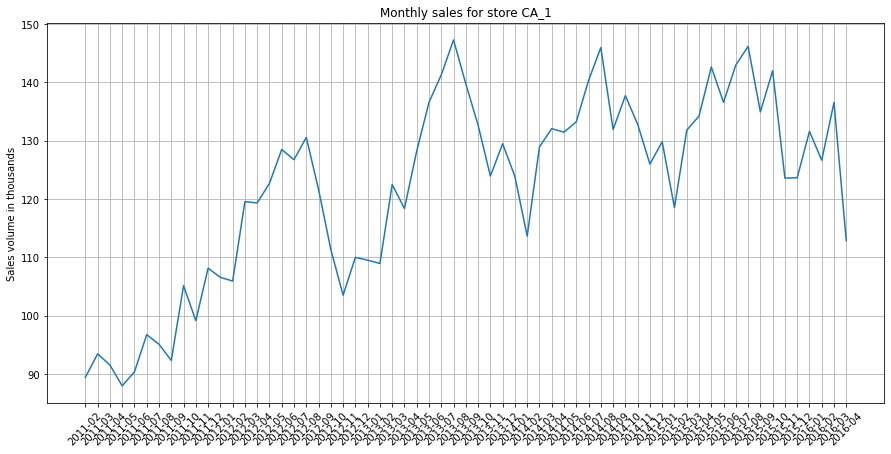

In [32]:
plt.figure(figsize=(15, 7))
plt.plot(y)
plt.title('Monthly sales for store CA_1')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

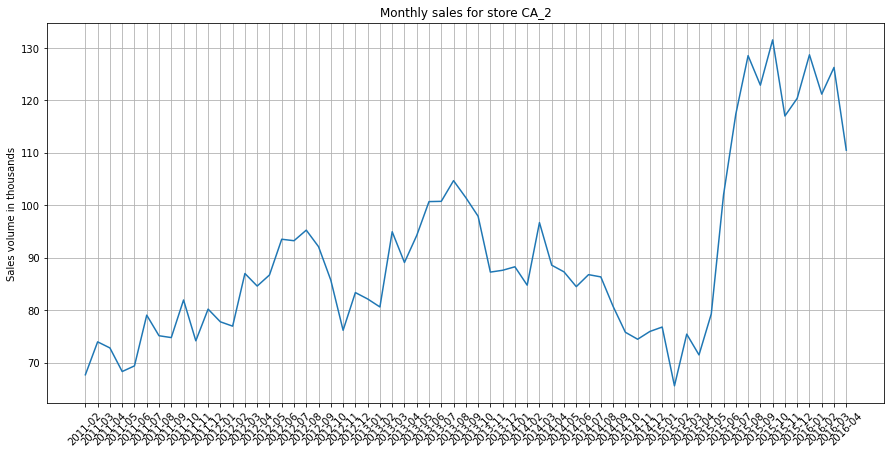

In [33]:
y = sv_mth_stores.loc['CA_2']/1000
plt.figure(figsize=(15, 7))
plt.plot(y)
plt.title('Monthly sales for store CA_2')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

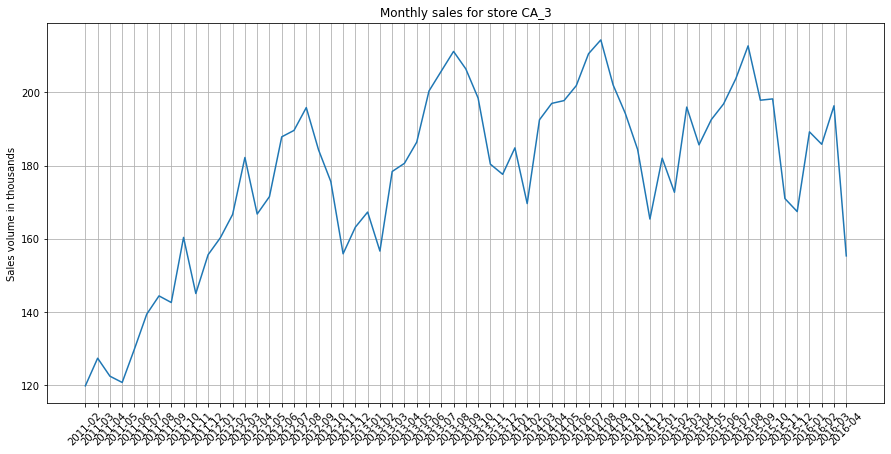

In [34]:
y = sv_mth_stores.loc['CA_3']/1000
plt.figure(figsize=(15, 7))
plt.plot(y)
plt.title('Monthly sales for store CA_3')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

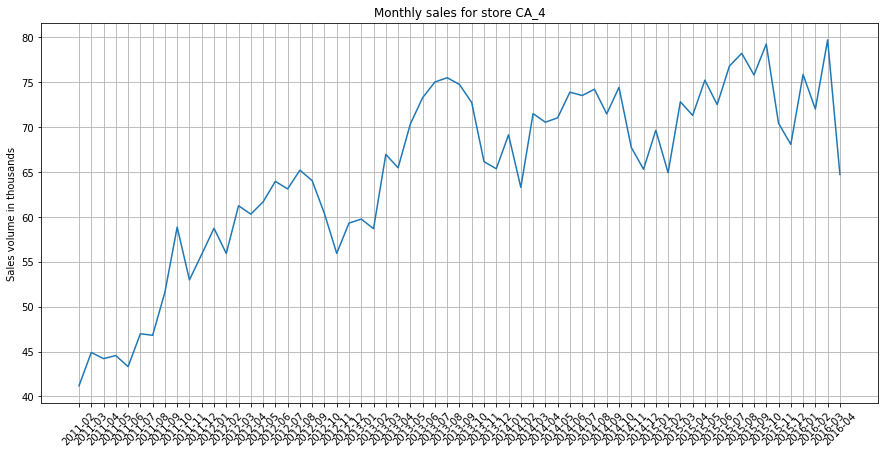

In [35]:
y = sv_mth_stores.loc['CA_4']/1000
plt.figure(figsize=(15, 7))
plt.plot(y)
plt.title('Monthly sales for store CA_4')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

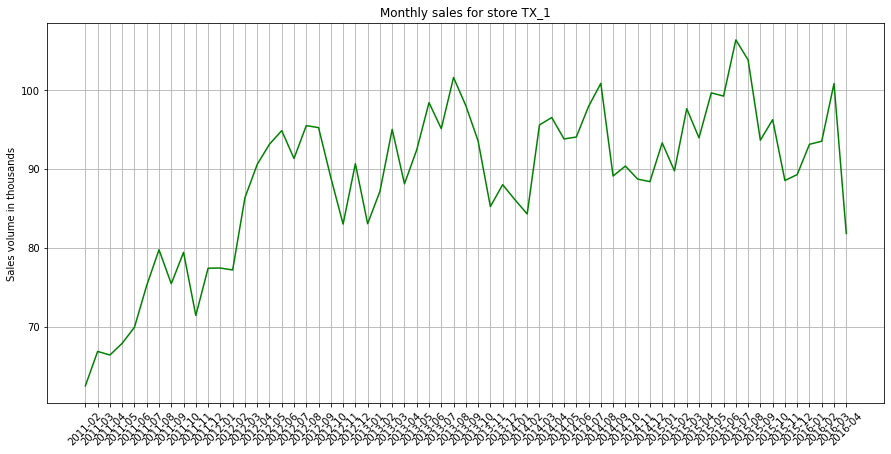

In [36]:
y = sv_mth_stores.loc['TX_1']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'green')
plt.title('Monthly sales for store TX_1')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

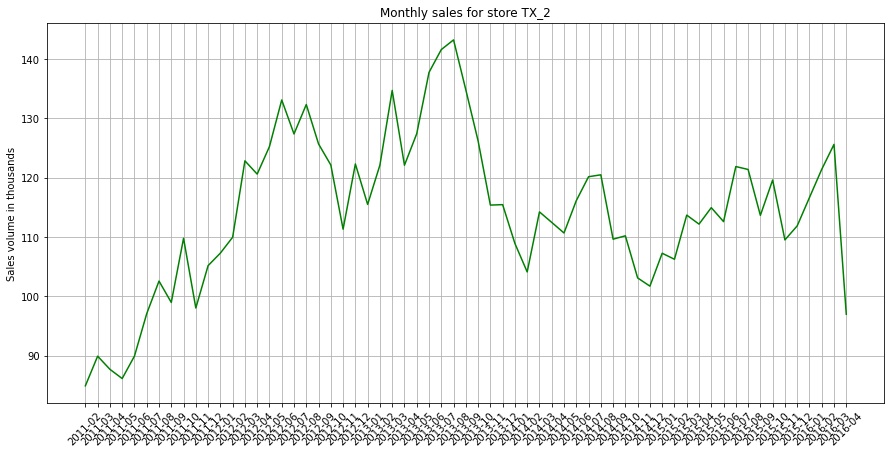

In [37]:
y = sv_mth_stores.loc['TX_2']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'green')
plt.title('Monthly sales for store TX_2')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

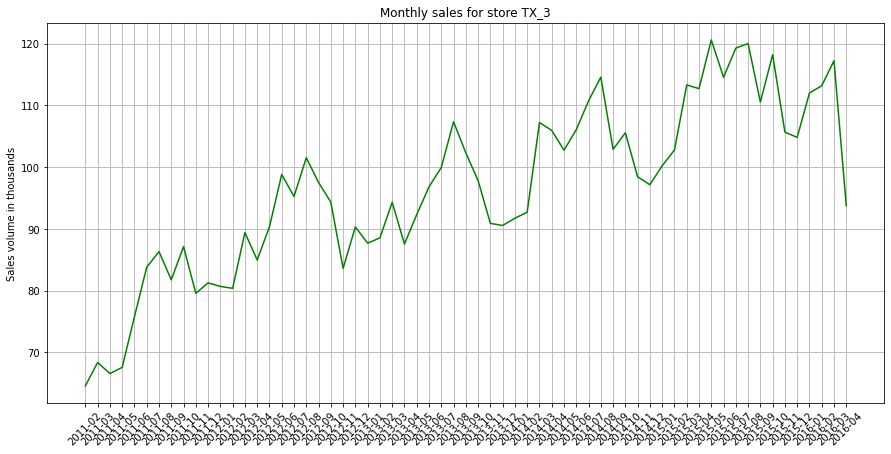

In [38]:
y = sv_mth_stores.loc['TX_3']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'green')
plt.title('Monthly sales for store TX_3')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

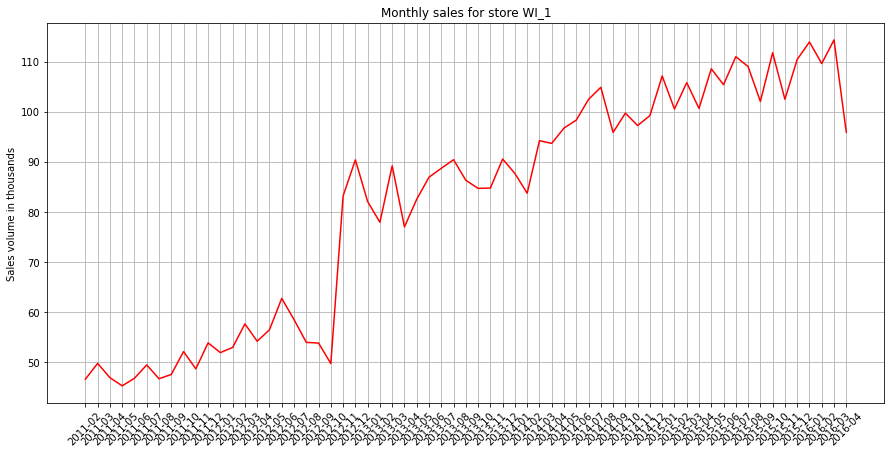

In [39]:
y = sv_mth_stores.loc['WI_1']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'red')
plt.title('Monthly sales for store WI_1')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

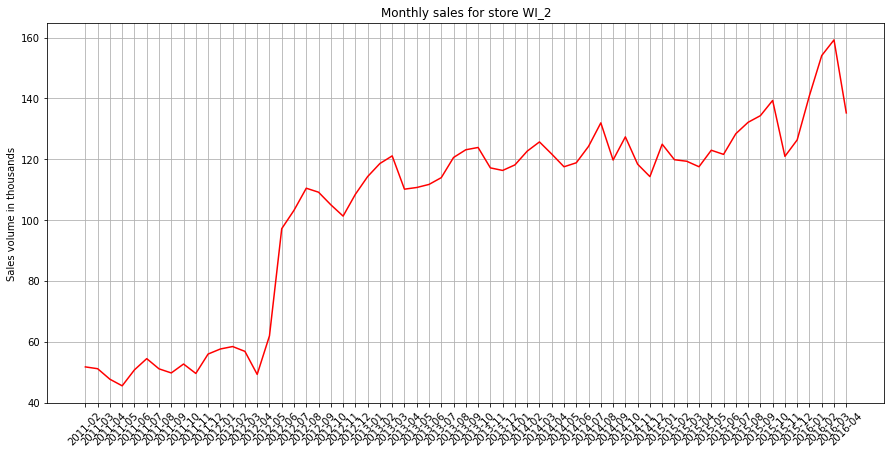

In [40]:
y = sv_mth_stores.loc['WI_2']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'red')
plt.title('Monthly sales for store WI_2')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

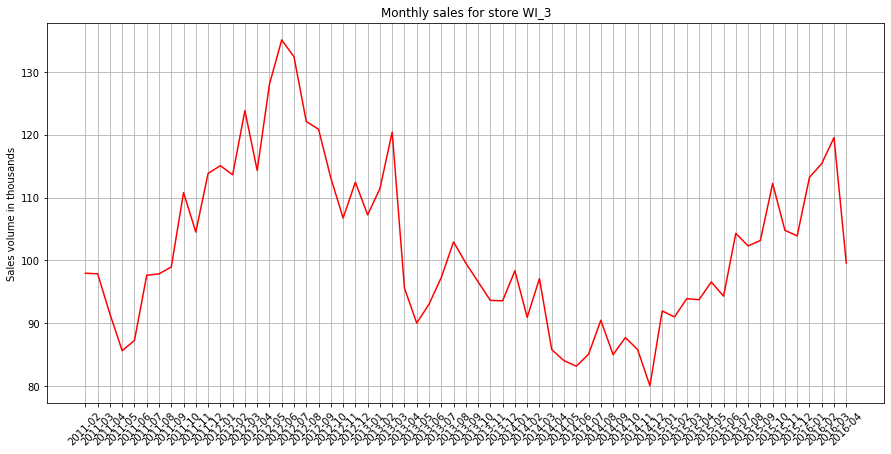

In [41]:
y = sv_mth_stores.loc['WI_3']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'red')
plt.title('Monthly sales for store WI_3')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

##### Monthly sales by products

In [42]:
sv_mth_products = sv_mth.groupby(['dept_id']).sum()

In [43]:
sv_mth_products.T

dept_id,FOODS_1,FOODS_2,FOODS_3,HOBBIES_1,HOBBIES_2,HOUSEHOLD_1,HOUSEHOLD_2
2011-02,54155,97919,368176,73316,4046,90773,37990
2011-03,53527,101792,379595,78140,5551,105264,39698
2011-04,50678,95555,363335,80455,5744,103027,38919
2011-05,47358,95489,348906,81096,6317,99905,40491
2011-06,48418,101350,376093,79453,5067,104019,38980
...,...,...,...,...,...,...,...
2015-12,99072,155008,470962,110357,14172,223716,52949
2016-01,98250,175997,533193,107390,10163,236184,54109
2016-02,89691,162777,552271,102243,10696,238352,56897
2016-03,95893,172242,587319,105133,11108,243840,60211


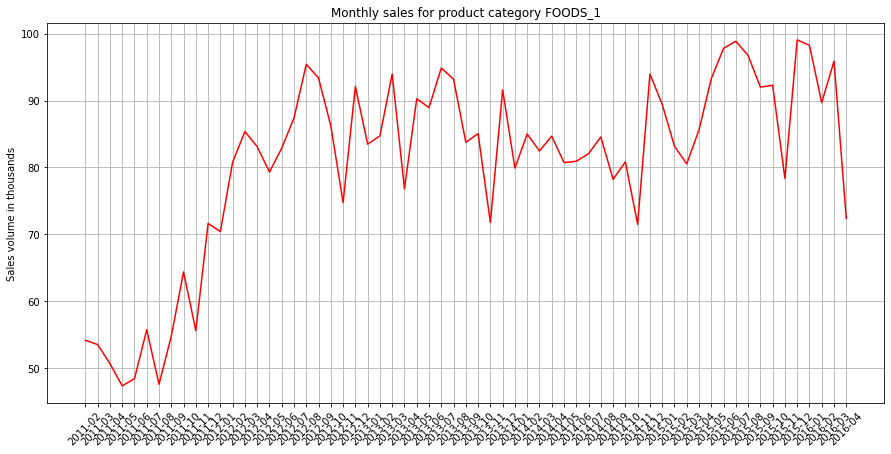

In [44]:
y = sv_mth_products.loc['FOODS_1']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'red')
plt.title('Monthly sales for product category FOODS_1')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

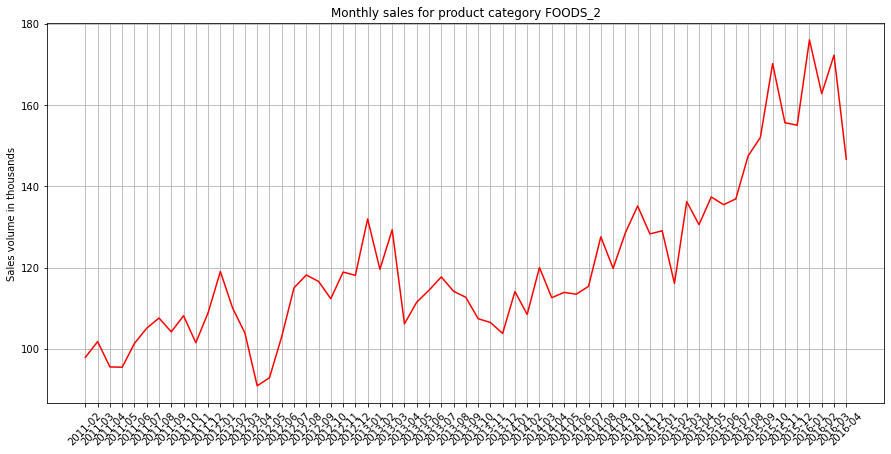

In [45]:
y = sv_mth_products.loc['FOODS_2']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'red')
plt.title('Monthly sales for product category FOODS_2')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

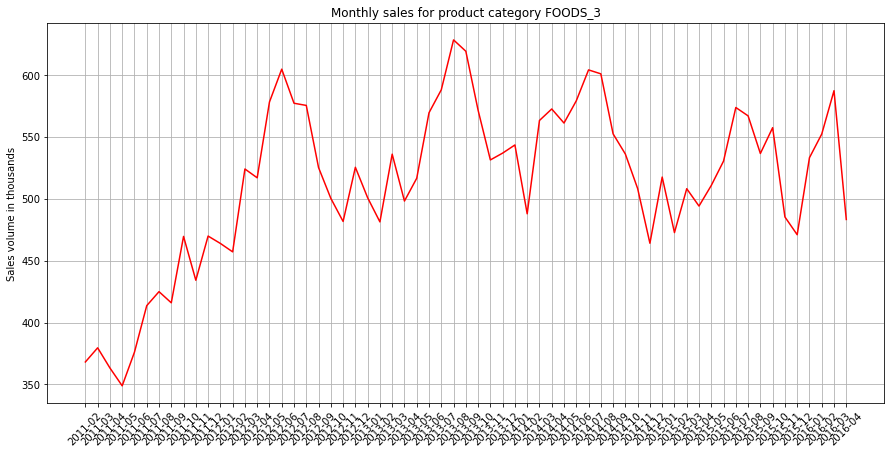

In [46]:
y = sv_mth_products.loc['FOODS_3']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'red')
plt.title('Monthly sales for product category FOODS_3')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

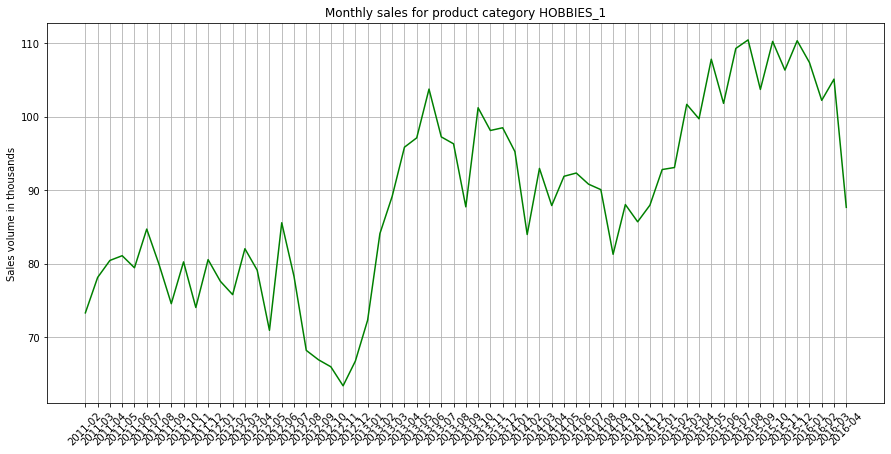

In [47]:
y = sv_mth_products.loc['HOBBIES_1']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'green')
plt.title('Monthly sales for product category HOBBIES_1')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

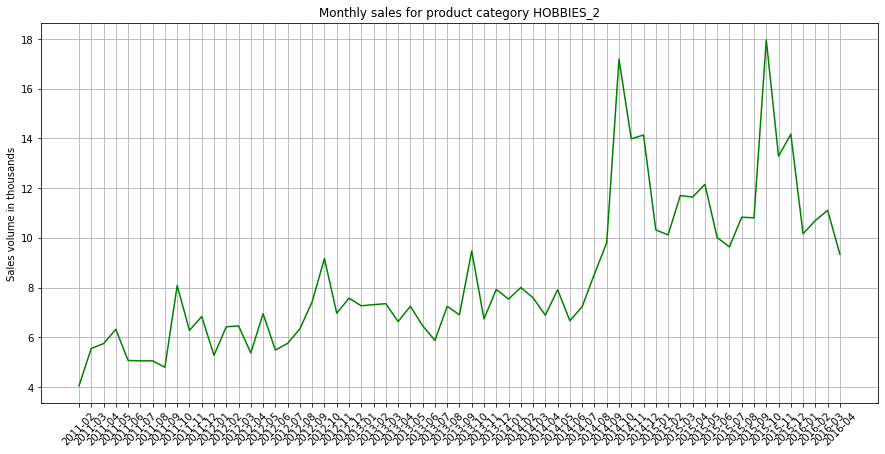

In [48]:
y = sv_mth_products.loc['HOBBIES_2']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'green')
plt.title('Monthly sales for product category HOBBIES_2')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

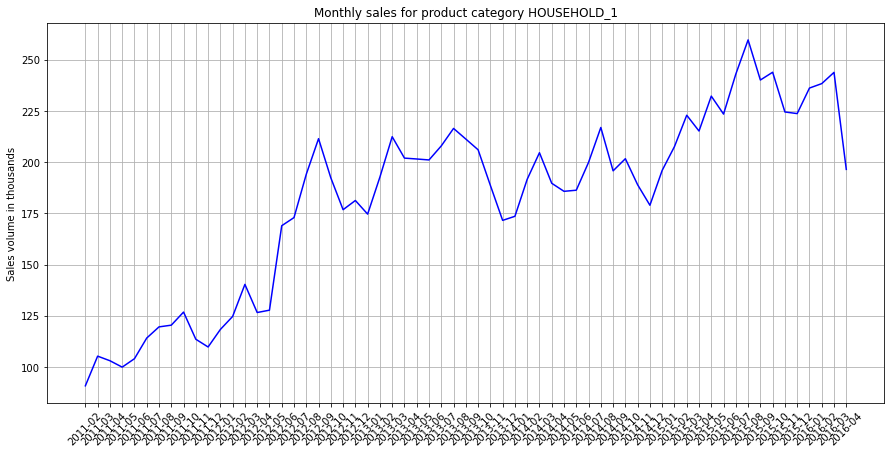

In [49]:
y = sv_mth_products.loc['HOUSEHOLD_1']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'blue')
plt.title('Monthly sales for product category HOUSEHOLD_1')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

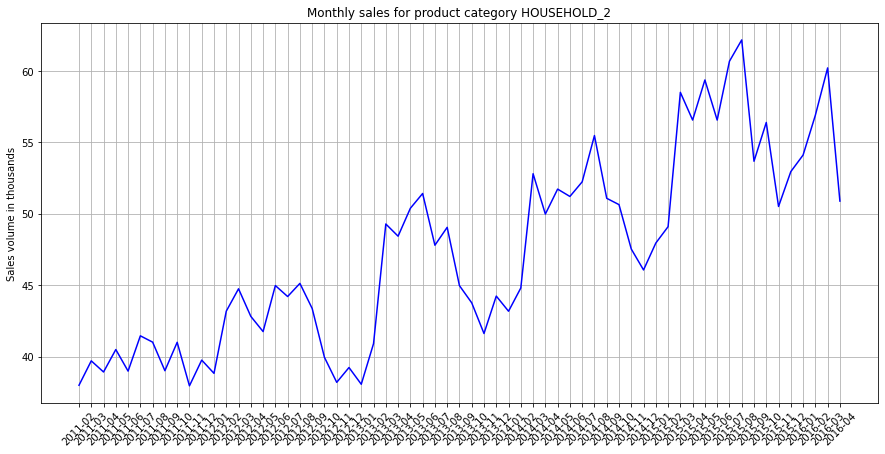

In [50]:
y = sv_mth_products.loc['HOUSEHOLD_2']/1000
plt.figure(figsize=(15, 7))
plt.plot(y, color = 'blue')
plt.title('Monthly sales for product category HOUSEHOLD_2')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.grid(True)
plt.show()

##### Monthly sales by products by states

In [51]:
sv_mth_pdt_state = sv_mth.groupby(['dept_id','state_id']).sum()
sv_mth_pdt_state

2011-02  2011-03  2011-04  2011-05  2011-06  2011-07  \
dept_id     state_id                                                         
FOODS_1     CA          27454    27096    25551    24674    25032    28881   
            TX          11850    10957    10418     9114     9973    11180   
            WI          14851    15474    14709    13570    13413    15681   
FOODS_2     CA          41308    43300    41441    41903    44872    46412   
            TX          32599    35358    32703    33229    34910    37620   
            WI          24012    23134    21411    20357    21568    21059   
FOODS_3     CA         154311   161976   156184   147128   154776   168038   
            TX         110700   118446   116026   116854   129389   140745   
            WI         103165    99173    91125    84924    91928   104879   
HOBBIES_1   CA          38371    41315    41395    41338    40846    43363   
            TX          16294    16663    17930    19086    19021    20886   
            WI          18651    20162    21130    20672    19586    20472   
HOBBIES_2   CA           1454     2187     2174     2540     2066     1927   
            TX           1539     1836     2017     2311     1663     1852   
            WI           1053     1528     1553     1466     1338     1271   
HOUSEHOLD_1 CA          35680    42726    43355    42198    43833    50227   
            TX          29065    31765    31796    30877    31233    34002   
            WI          26028    30773    27876    26830    28953    29874   
HOUSEHOLD_2 CA          19523    21078    20904    21785    21523    23335   
            TX           9968    10137     9791    10149     9464     9843   
            WI           8499     8483     8224     8557     7993     8273   

                      2011-08  2011-09  2011-10  2011-11  ...  2015-07  \
dept_id     state_id                                      ...            
FOODS_1     CA          23903    26582    33026    27479  ...    45176   
            TX          10903    12460    14858    12768  ...    24236   
            WI          12785    15726    16498    15358  ...    29463   
FOODS_2     CA          46897    44904    47766    44673  ...    53530   
            TX          38556    36107    37340    34788  ...    36902   
            WI          22134    23186    23044    22046  ...    46458   
FOODS_3     CA         170737   175724   202860   190076  ...   245723   
            TX         153476   143174   153603   136277  ...   166275   
            WI         100761    97064   113132   107832  ...   161742   
HOBBIES_1   CA          41664    38420    41343    37395  ...    55797   
            TX          18710    17073    18796    17330  ...    27921   
            WI          19551    19071    20117    19322  ...    25592   
HOBBIES_2   CA           1871     1674     2893     2068  ...     4332   
            TX           1943     1990     3291     2626  ...     3052   
            WI           1239     1129     1897     1583  ...     2249   
HOUSEHOLD_1 CA          53715    52286    56056    48410  ...   105119   
            TX          34897    35631    37606    35585  ...    72420   
            WI          30944    32474    33119    29521  ...    65483   
HOUSEHOLD_2 CA          22649    21704    22389    21235  ...    31274   
            TX          10164     9736    10857     9656  ...    16701   
            WI           8195     7568     7752     7059  ...    12702   

                      2015-08  2015-09  2015-10  2015-11  2015-12  2016-01  \
dept_id     state_id                                                         
FOODS_1     CA          46052    41250    42397    34962    47039    44714   
            TX          22697    23688    24133    19884    22950    24954   
            WI          27992    27075    25765    23508    29083    28582   
FOODS_2     CA          58203    60147    64835    59943    56975    65992   
            TX          38295    38111    40449    37264

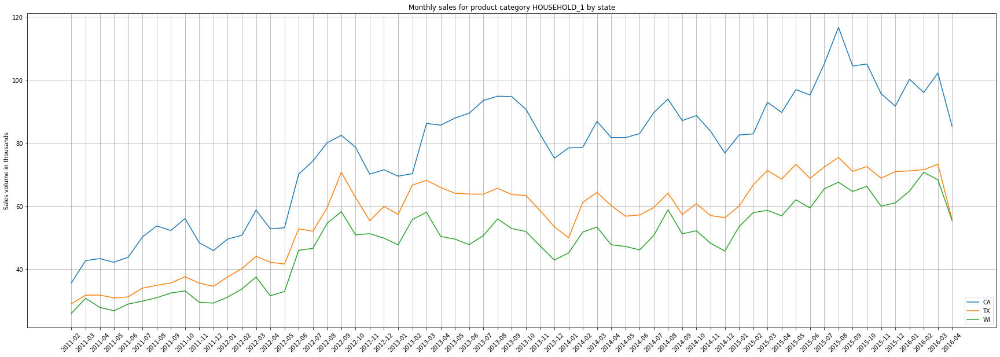

In [52]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_1','CA'].T/1000, label = 'CA')
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_1','TX'].T/1000, label = 'TX')
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_1','WI'].T/1000, label = 'WI')

plt.title('Monthly sales for product category HOUSEHOLD_1 by state')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

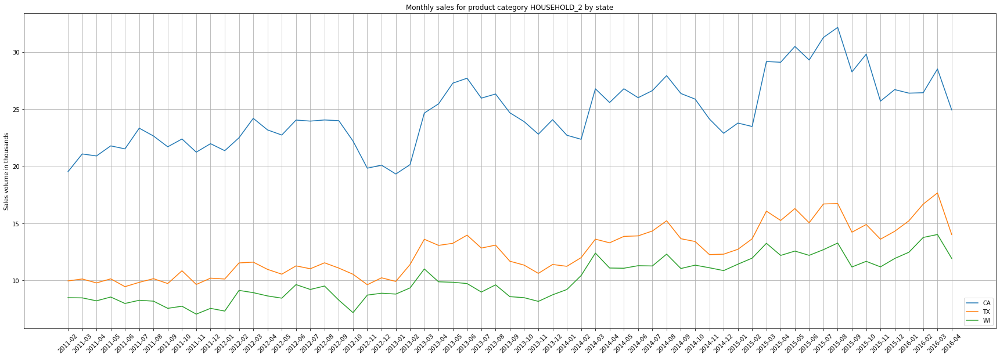

In [53]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_2','CA'].T/1000, label = 'CA')
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_2','TX'].T/1000, label = 'TX')
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_2','WI'].T/1000, label = 'WI')

plt.title('Monthly sales for product category HOUSEHOLD_2 by state')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

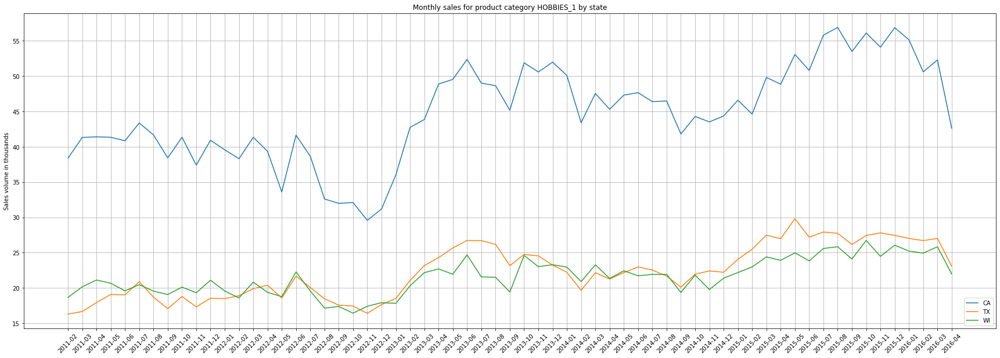

In [54]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_state.loc['HOBBIES_1','CA'].T/1000, label = 'CA')
plt.plot(sv_mth_pdt_state.loc['HOBBIES_1','TX'].T/1000, label = 'TX')
plt.plot(sv_mth_pdt_state.loc['HOBBIES_1','WI'].T/1000, label = 'WI')

plt.title('Monthly sales for product category HOBBIES_1 by state')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

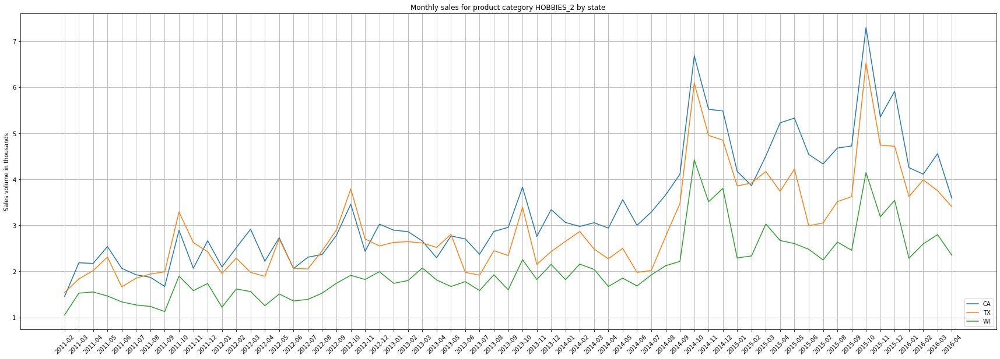

In [55]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_state.loc['HOBBIES_2','CA'].T/1000, label = 'CA')
plt.plot(sv_mth_pdt_state.loc['HOBBIES_2','TX'].T/1000, label = 'TX')
plt.plot(sv_mth_pdt_state.loc['HOBBIES_2','WI'].T/1000, label = 'WI')

plt.title('Monthly sales for product category HOBBIES_2 by state')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

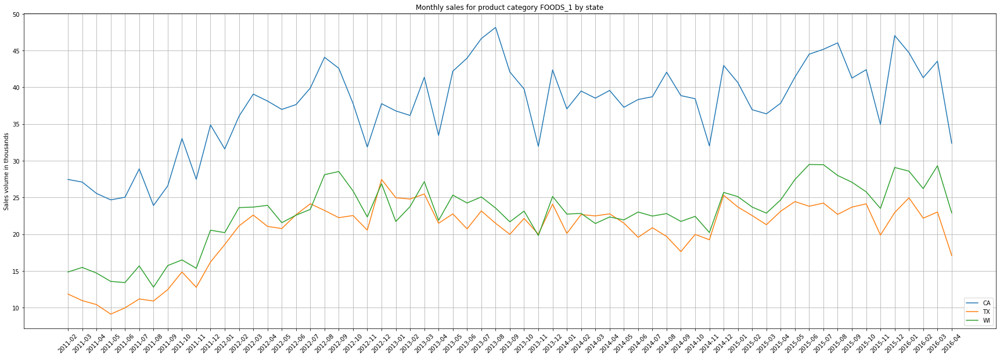

In [56]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_state.loc['FOODS_1','CA'].T/1000, label = 'CA')
plt.plot(sv_mth_pdt_state.loc['FOODS_1','TX'].T/1000, label = 'TX')
plt.plot(sv_mth_pdt_state.loc['FOODS_1','WI'].T/1000, label = 'WI')

plt.title('Monthly sales for product category FOODS_1 by state')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

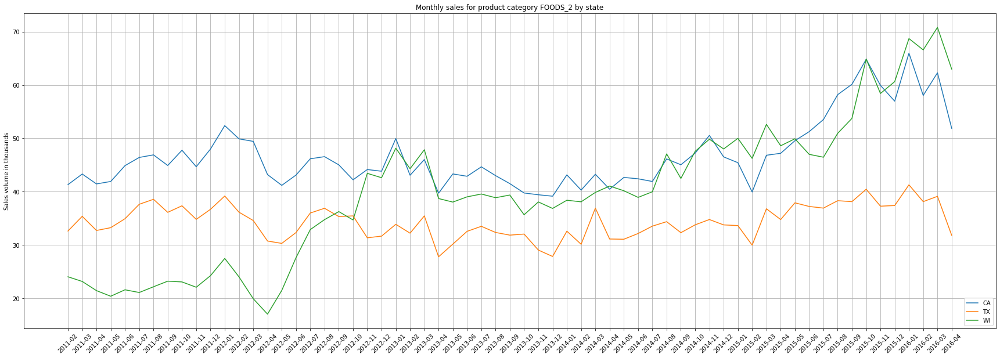

In [57]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_state.loc['FOODS_2','CA'].T/1000, label = 'CA')
plt.plot(sv_mth_pdt_state.loc['FOODS_2','TX'].T/1000, label = 'TX')
plt.plot(sv_mth_pdt_state.loc['FOODS_2','WI'].T/1000, label = 'WI')

plt.title('Monthly sales for product category FOODS_2 by state')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

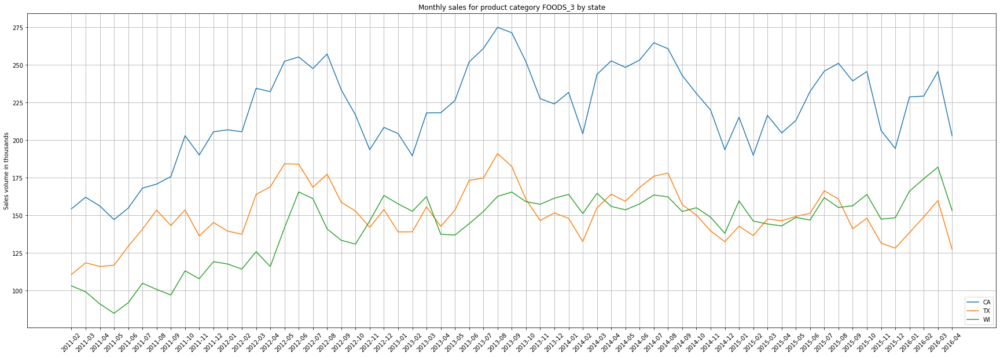

In [58]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_state.loc['FOODS_3','CA'].T/1000, label = 'CA')
plt.plot(sv_mth_pdt_state.loc['FOODS_3','TX'].T/1000, label = 'TX')
plt.plot(sv_mth_pdt_state.loc['FOODS_3','WI'].T/1000, label = 'WI')

plt.title('Monthly sales for product category FOODS_3 by state')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

##### Monthly sales by products by stores

In [59]:
sv_mth_pdt_store = sv_mth.groupby(['dept_id','store_id']).sum()
sv_mth_pdt_store

2011-02  2011-03  2011-04  2011-05  2011-06  2011-07  \
dept_id     store_id                                                         
FOODS_1     CA_1         6595     6952     5507     5569     6281     6726   
            CA_2         9265     8698     8782     8334     8672    10476   
            CA_3         8987     8338     8222     7793     7316     8348   
            CA_4         2607     3108     3040     2978     2763     3331   
            TX_1         3332     3328     3208     3253     2921     2801   
...                       ...      ...      ...      ...      ...      ...   
HOUSEHOLD_2 TX_2         4226     4331     4187     4349     4014     4333   
            TX_3         2850     3036     2845     2922     2809     2881   
            WI_1         2986     3262     3107     3098     2901     2859   
            WI_2         2133     1997     1963     1966     1788     1986   
            WI_3         3380     3224     3154     3493     3304     3428   

                      2011-08  2011-09  2011-10  2011-11  ...  2015-07  \
dept_id     store_id                                      ...            
FOODS_1     CA_1         5785     5590     6571     5701  ...    12007   
            CA_2         8175     9016    10921     9447  ...    12434   
            CA_3         7280     7668     9938     8238  ...    13270   
            CA_4         2663     4308     5596     4093  ...     7465   
            TX_1         2545     3146     3888     3347  ...     8246   
...                       ...      ...      ...      ...  ...      ...   
HOUSEHOLD_2 TX_2         4425     4054     4583     3944  ...     6299   
            TX_3         2948     2862     3315     2996  ...     4960   
            WI_1         2947     2796     2992     2751  ...     5099   
            WI_2         1956     1547     1380     1155  ...     3563   
            WI_3         3292     3225     3380     3153  ...     4040   

                      2015-08  2015-09  2015-10  2015-11  2015-12  2016-01  \
dept_id     store_id                                                         
FOODS_1     CA_1        10666     9074     9049     6944    10596     9101   
            CA_2        13859    12221    13926    11803    14221    14020   
            CA_3        14103    12838    12056    10518    14863    14872   
            CA_4         7424     7117     7366     5697     7359     6721   
            TX_1         6856     6947     7096     5497     6367     8359   
...                       ...      ...      ...      ...      ...      ...   
HOUSEHOLD_2 TX_2         6373     5276     5460     4940     5391     5561   
            TX_3         4879     4450     4850     4464     4508     4394   
            WI_1         5009     4346     4443     4240     4591     4636   
            WI_2         4018     3709     3790     3441     3462     3742   
            WI_3         4255     3131     3448     3515     3876     4101   

                      2016-02  2016-03  2016-04  
dept_id     store_id                             
FOODS_1     CA_1         9186    10148     7030  
            CA_2        12714    13226    11138  
            CA_3        13444    13092     9096  
            CA_4         5963     7093     5118  
            TX_1         5838     6184     4983  
...                       ...      ...      ...  
HOUSEHOLD_2 TX_2         6152     6203     5128  
            TX_3         5027     5194     4261  
            WI_1         4595     4998     4333  
            WI_2         4590     4320     3581  
            WI_3         4585     4710     4020  

[70 rows x 63 columns]

In [124]:
#sv_mth_pdt_store.index

In [61]:
sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_2'].T/1000

2011-02    6.130
2011-03    6.687
2011-04    6.449
2011-05    6.662
2011-06    6.416
           ...  
2015-12    8.908
2016-01    9.108
2016-02    8.264
2016-03    8.113
2016-04    7.935
Name: (HOUSEHOLD_2, CA_2), Length: 63, dtype: float64

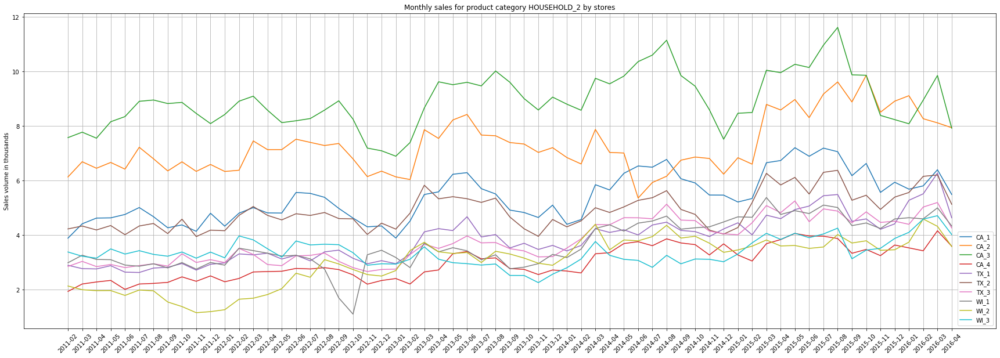

In [62]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_4'].T/1000, label = 'CA_4')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','TX_3'].T/1000, label = 'TX_3')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','WI_3'].T/1000, label = 'WI_3')


plt.title('Monthly sales for product category HOUSEHOLD_2 by stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

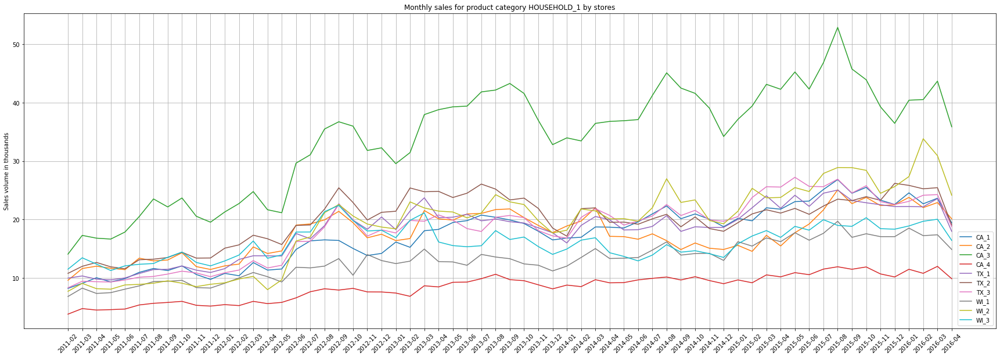

In [63]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','CA_4'].T/1000, label = 'CA_4')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','TX_3'].T/1000, label = 'TX_3')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','WI_3'].T/1000, label = 'WI_3')


plt.title('Monthly sales for product category HOUSEHOLD_1 by stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

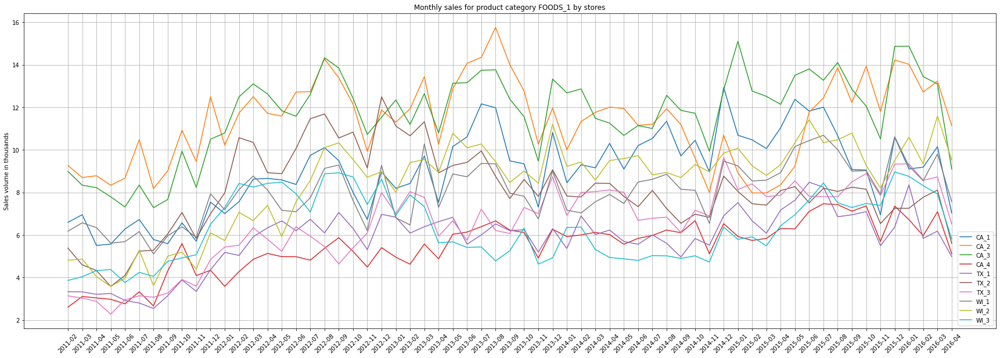

In [64]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_1','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','CA_4'].T/1000, label = 'CA_4')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','TX_3'].T/1000, label = 'TX_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','WI_3'].T/1000, label = 'WI_3')


plt.title('Monthly sales for product category FOODS_1 by stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

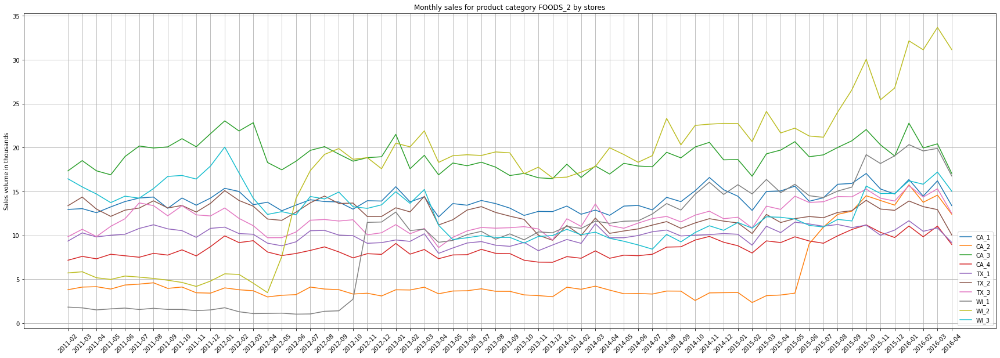

In [65]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_2','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','CA_4'].T/1000, label = 'CA_4')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','TX_3'].T/1000, label = 'TX_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','WI_3'].T/1000, label = 'WI_3')


plt.title('Monthly sales for product category FOODS_2 by stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

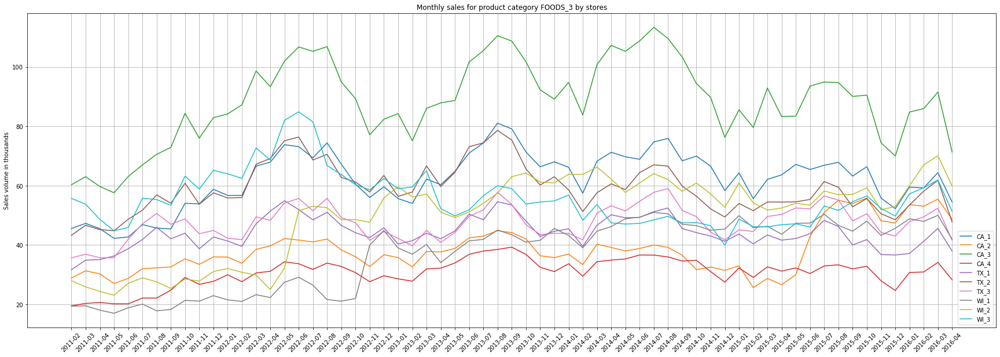

In [66]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_3','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','CA_4'].T/1000, label = 'CA_4')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','TX_3'].T/1000, label = 'TX_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','WI_3'].T/1000, label = 'WI_3')


plt.title('Monthly sales for product category FOODS_3 by stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

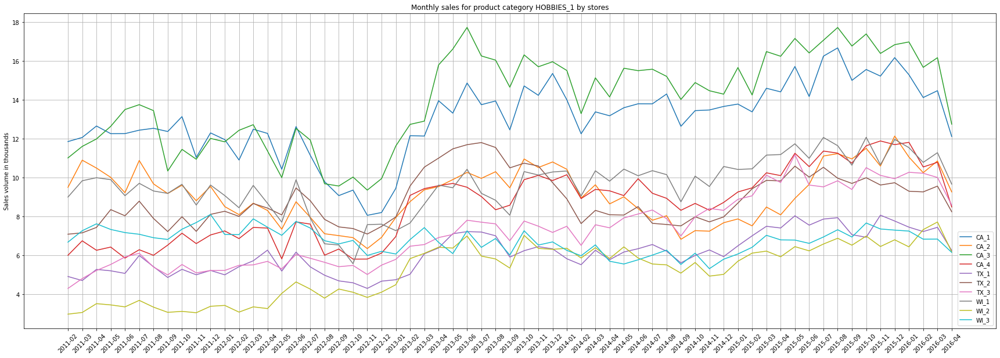

In [67]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','CA_4'].T/1000, label = 'CA_4')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','TX_3'].T/1000, label = 'TX_3')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','WI_3'].T/1000, label = 'WI_3')


plt.title('Monthly sales for product category HOBBIES_1 by stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

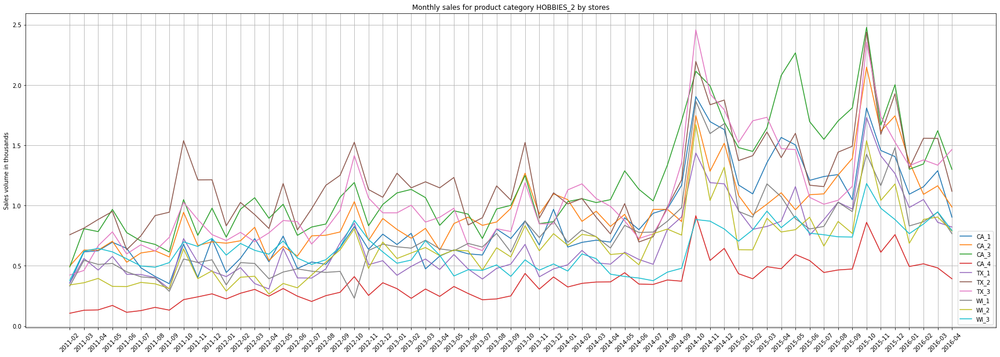

In [68]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','CA_4'].T/1000, label = 'CA_4')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','TX_3'].T/1000, label = 'TX_3')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','WI_3'].T/1000, label = 'WI_3')


plt.title('Monthly sales for product category HOBBIES_2 by stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

##### Monthly sales by products by state, with breakdown by stores

### CA and stores

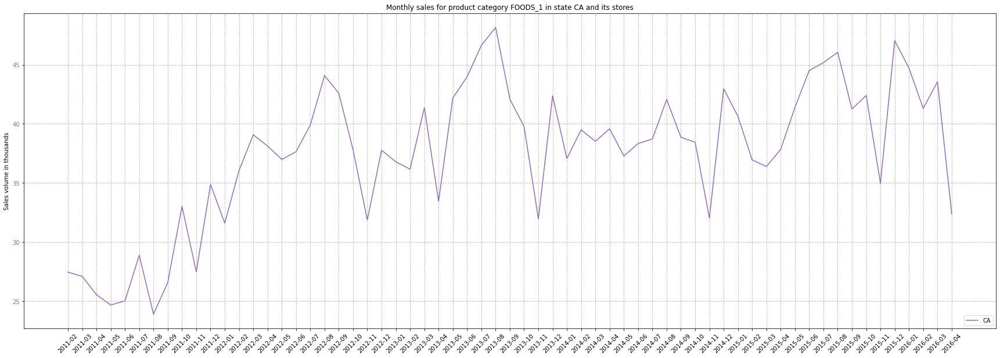

In [83]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_1','CA'].T/1000, color=color, label = 'CA')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_1 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

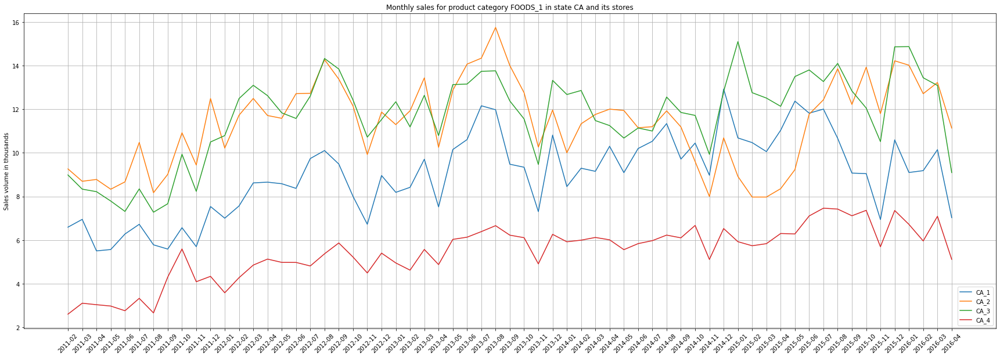

In [84]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_1','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','CA_4'].T/1000, label = 'CA_4')

            
plt.title('Monthly sales for product category FOODS_1 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

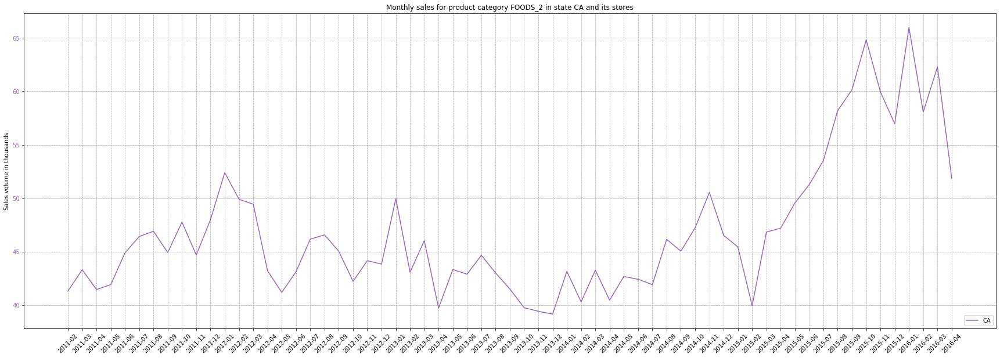

In [85]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_2','CA'].T/1000, color=color, label = 'CA')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_2 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

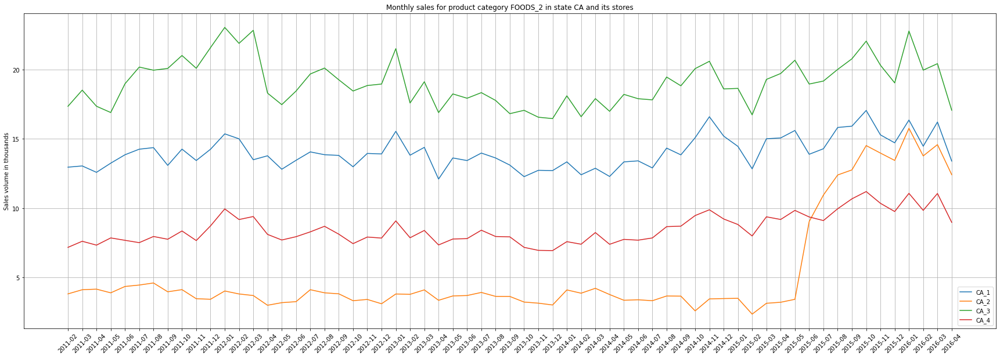

In [86]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_2','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','CA_4'].T/1000, label = 'CA_4')

            
plt.title('Monthly sales for product category FOODS_2 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

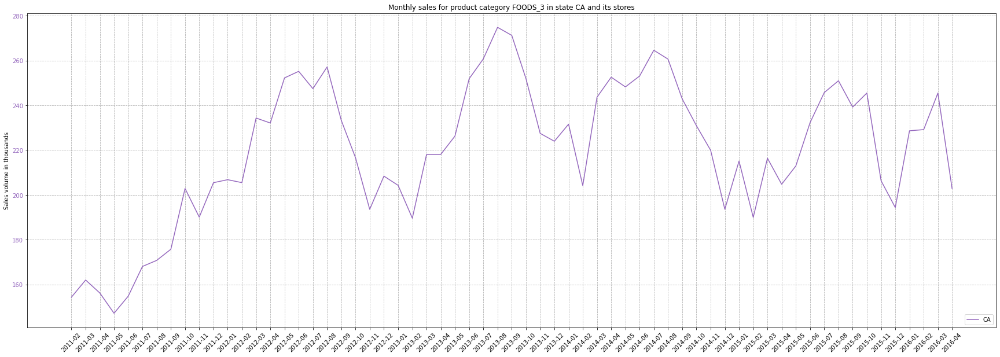

In [87]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_3','CA'].T/1000, color=color, label = 'CA')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_3 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

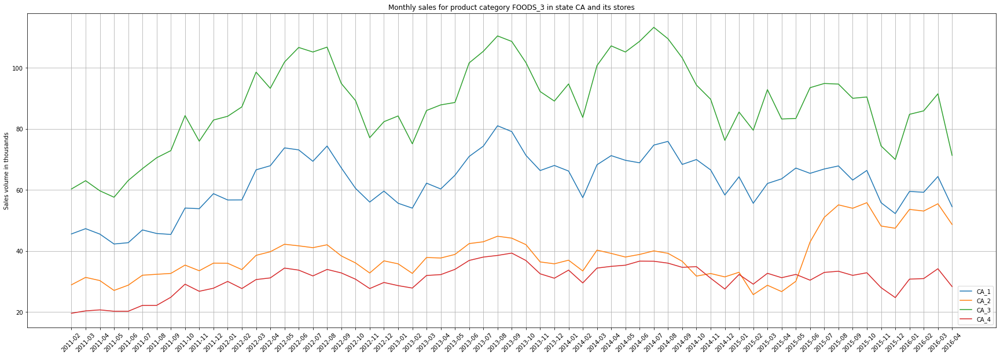

In [88]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_3','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','CA_4'].T/1000, label = 'CA_4')

            
plt.title('Monthly sales for product category FOODS_3 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

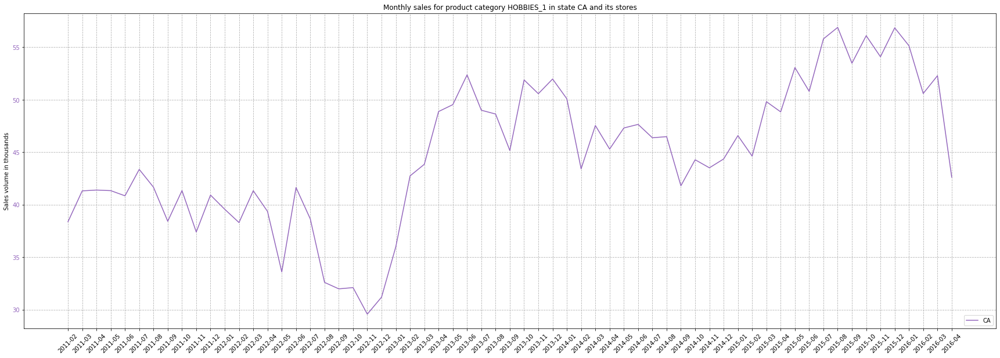

In [89]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOBBIES_1','CA'].T/1000, color=color, label = 'CA')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOBBIES_1 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

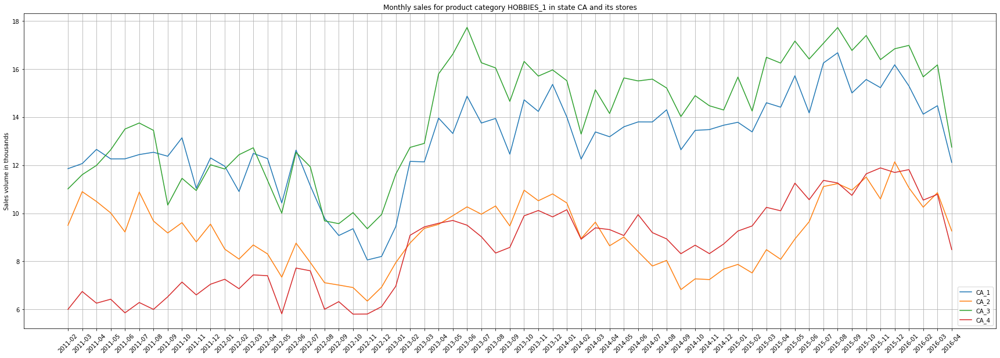

In [90]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','CA_4'].T/1000, label = 'CA_4')

            
plt.title('Monthly sales for product category HOBBIES_1 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

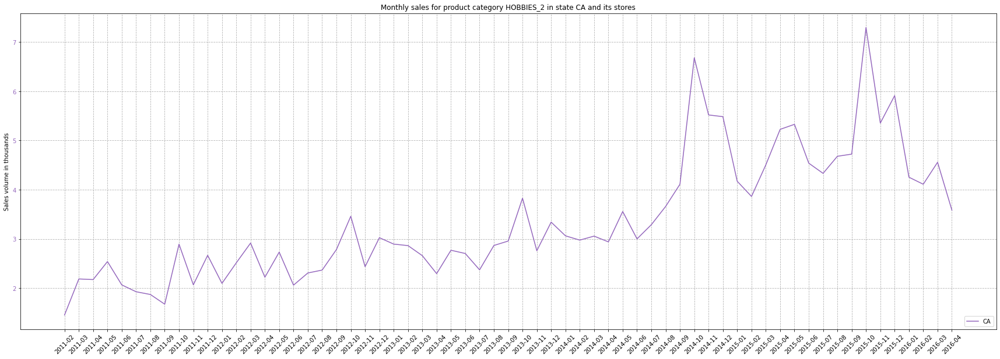

In [91]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOBBIES_2','CA'].T/1000, color=color, label = 'CA')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOBBIES_2 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

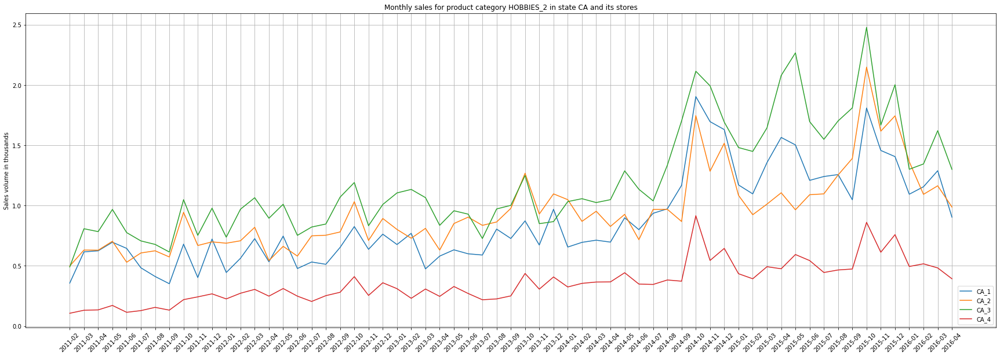

In [92]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','CA_4'].T/1000, label = 'CA_4')

            
plt.title('Monthly sales for product category HOBBIES_2 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

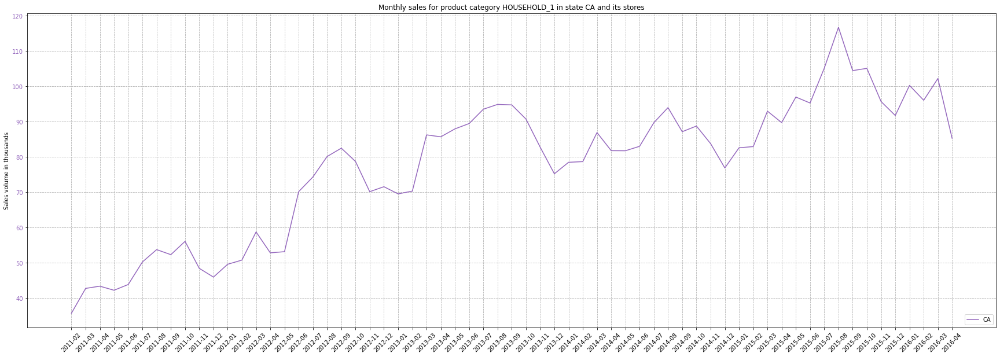

In [93]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_1','CA'].T/1000, color=color, label = 'CA')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOUSEHOLD_1 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

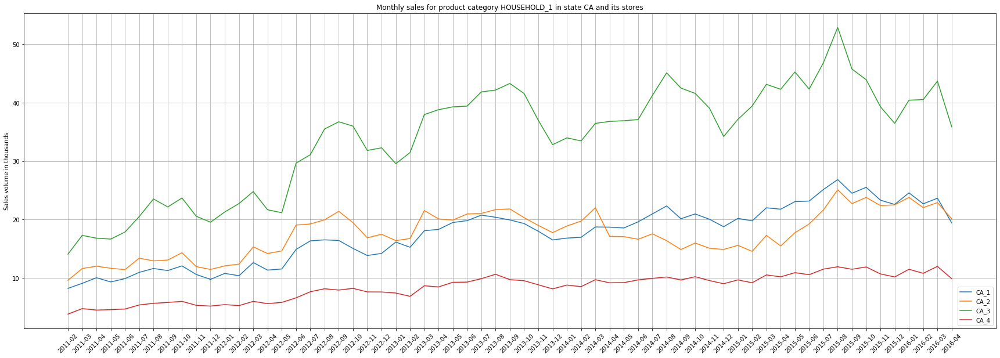

In [94]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','CA_4'].T/1000, label = 'CA_4')

            
plt.title('Monthly sales for product category HOUSEHOLD_1 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

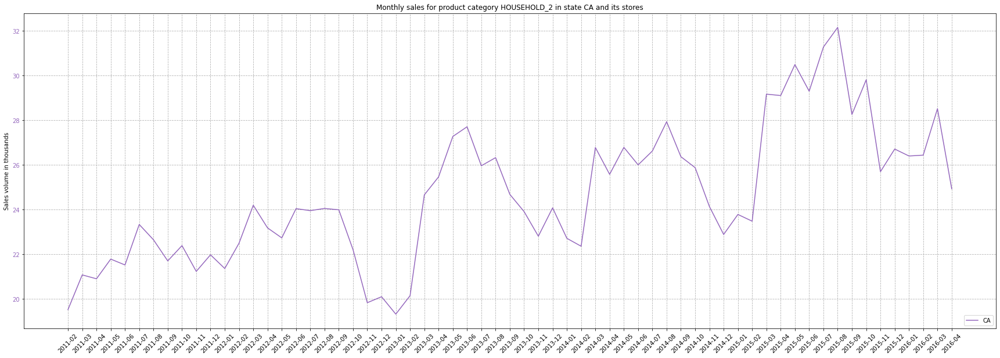

In [95]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_2','CA'].T/1000, color=color, label = 'CA')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOUSEHOLD_2 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

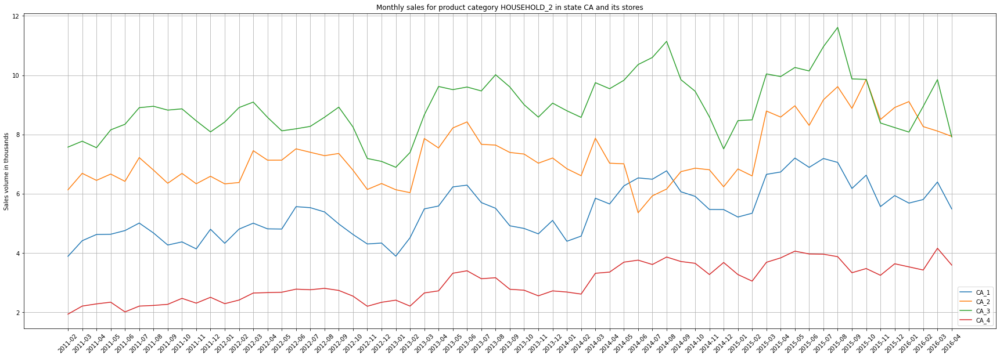

In [96]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_1'].T/1000, label = 'CA_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_2'].T/1000, label = 'CA_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_3'].T/1000, label = 'CA_3')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','CA_4'].T/1000, label = 'CA_4')

            
plt.title('Monthly sales for product category HOUSEHOLD_2 in state CA and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

### TX and stores

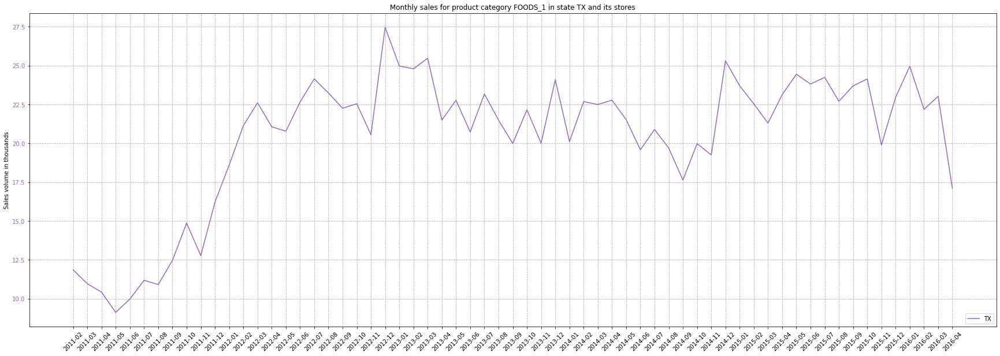

In [97]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_1','TX'].T/1000, color=color, label = 'TX')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_1 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

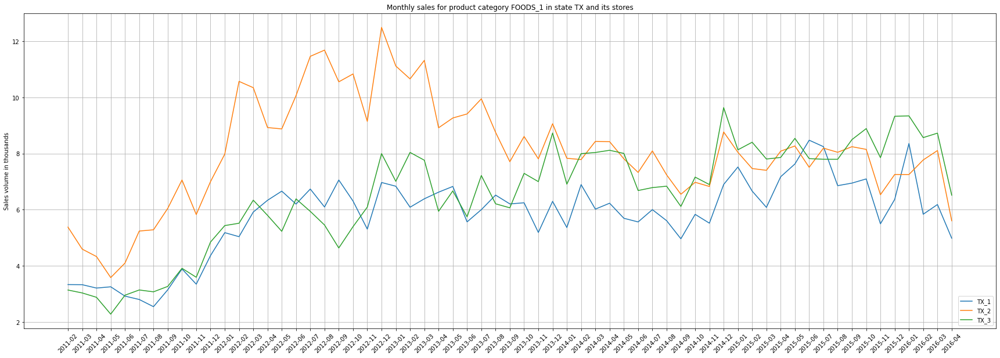

In [98]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_1','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','TX_3'].T/1000, label = 'TX_3')

            
plt.title('Monthly sales for product category FOODS_1 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

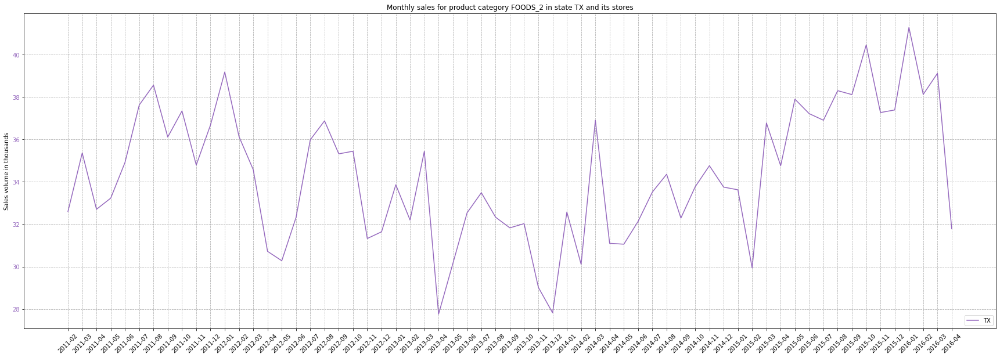

In [99]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_2','TX'].T/1000, color=color, label = 'TX')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_2 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

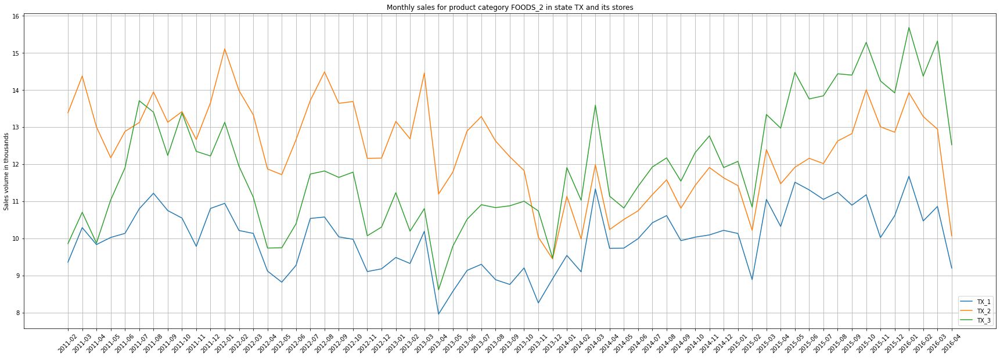

In [100]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_2','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','TX_3'].T/1000, label = 'TX_3')

            
plt.title('Monthly sales for product category FOODS_2 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

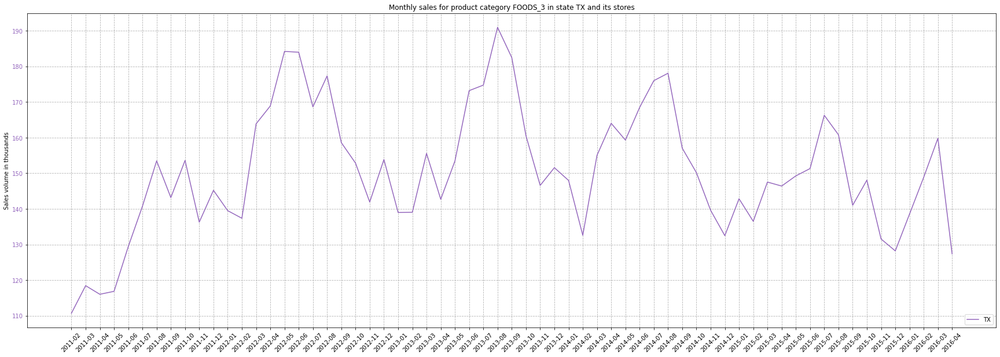

In [101]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_3','TX'].T/1000, color=color, label = 'TX')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_3 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

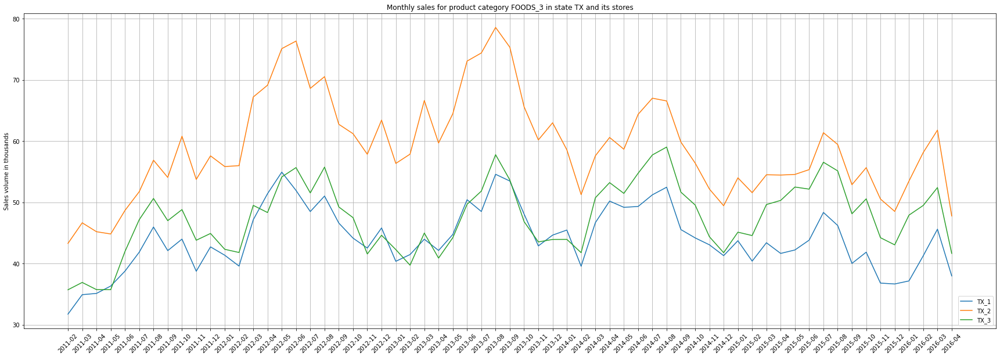

In [102]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_3','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','TX_3'].T/1000, label = 'TX_3')
            
plt.title('Monthly sales for product category FOODS_3 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

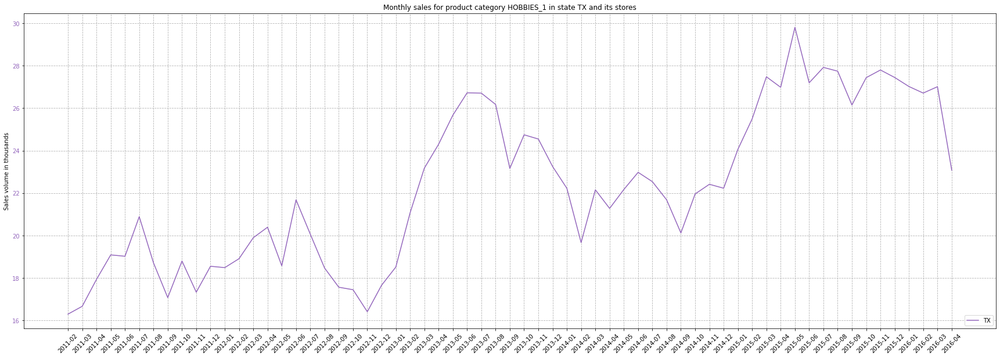

In [103]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOBBIES_1','TX'].T/1000, color=color, label = 'TX')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOBBIES_1 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

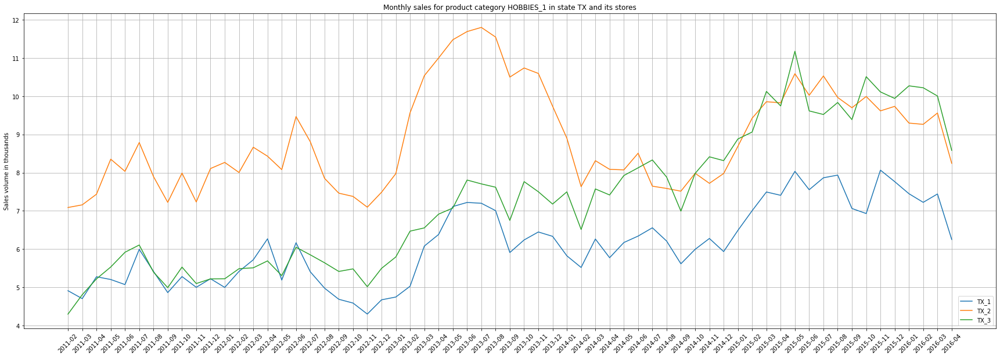

In [104]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','TX_3'].T/1000, label = 'TX_3')
            
plt.title('Monthly sales for product category HOBBIES_1 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

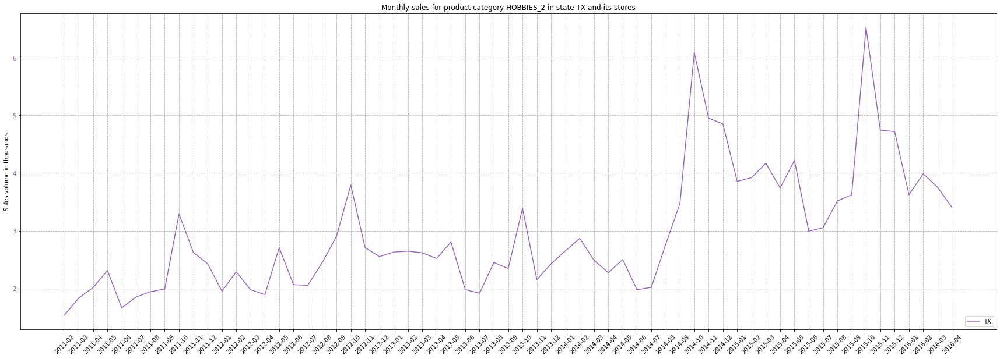

In [105]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOBBIES_2','TX'].T/1000, color=color, label = 'TX')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOBBIES_2 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

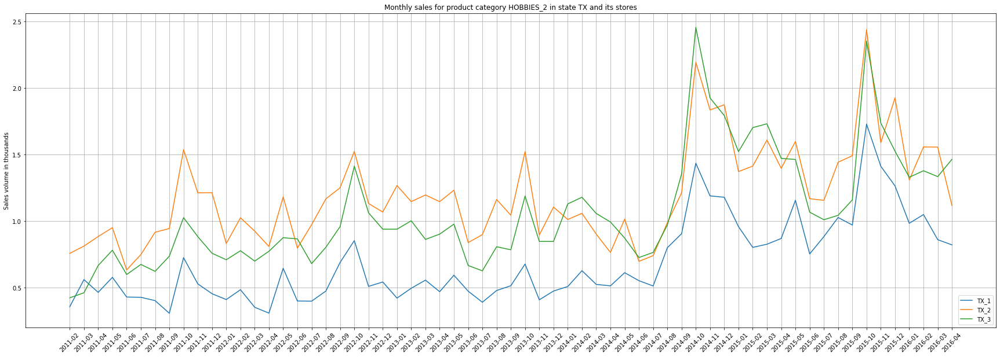

In [106]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','TX_3'].T/1000, label = 'TX_3')
            
plt.title('Monthly sales for product category HOBBIES_2 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

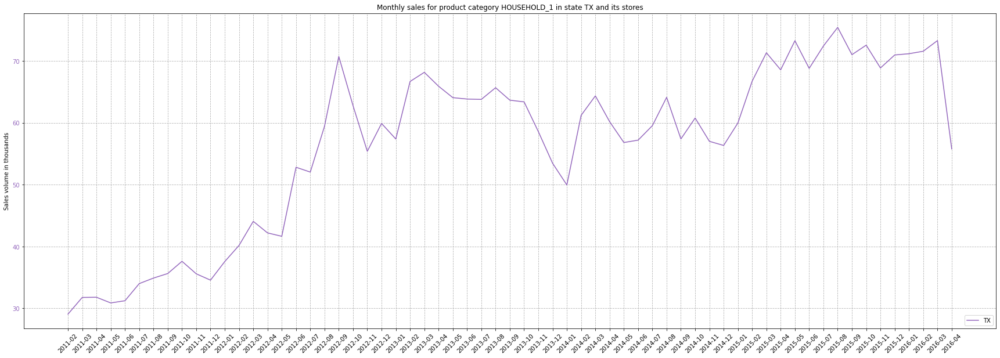

In [107]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_1','TX'].T/1000, color=color, label = 'TX')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOUSEHOLD_1 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

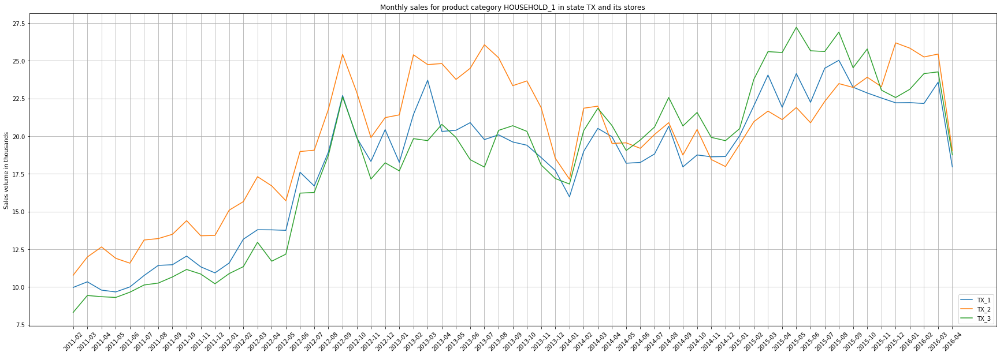

In [108]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','TX_3'].T/1000, label = 'TX_3')
            
plt.title('Monthly sales for product category HOUSEHOLD_1 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

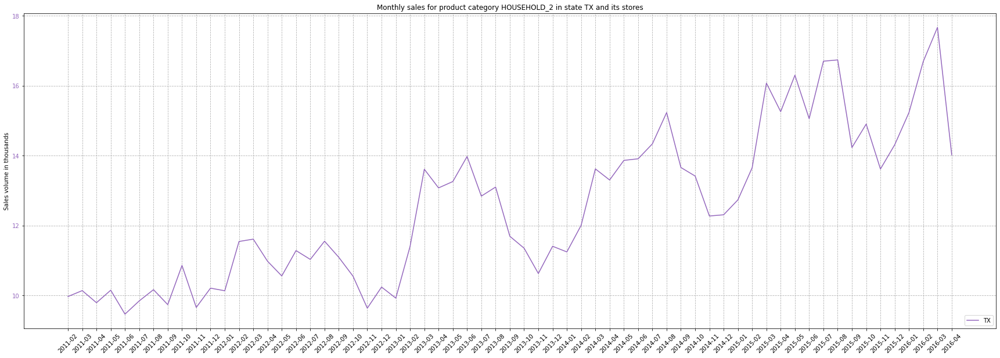

In [109]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_2','TX'].T/1000, color=color, label = 'TX')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOUSEHOLD_2 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

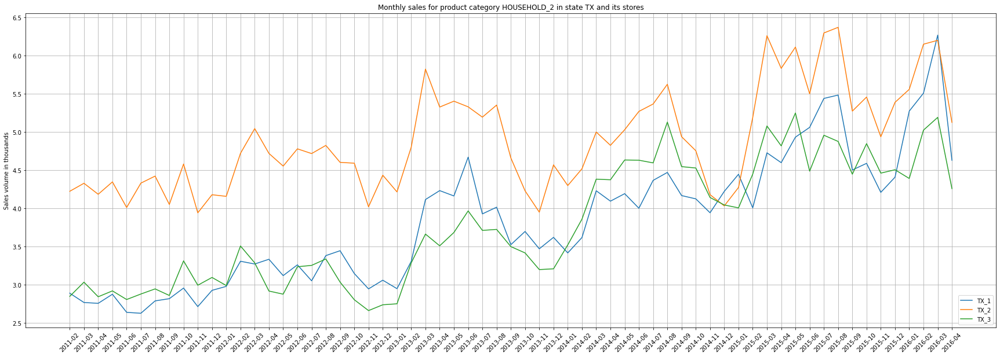

In [110]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','TX_1'].T/1000, label = 'TX_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','TX_2'].T/1000, label = 'TX_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','TX_3'].T/1000, label = 'TX_3')
            
plt.title('Monthly sales for product category HOUSEHOLD_2 in state TX and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

### WI and stores

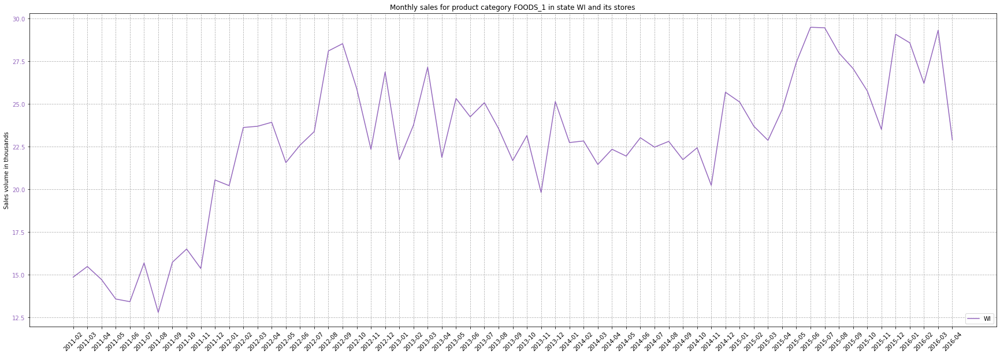

In [111]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_1','WI'].T/1000, color=color, label = 'WI')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_1 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

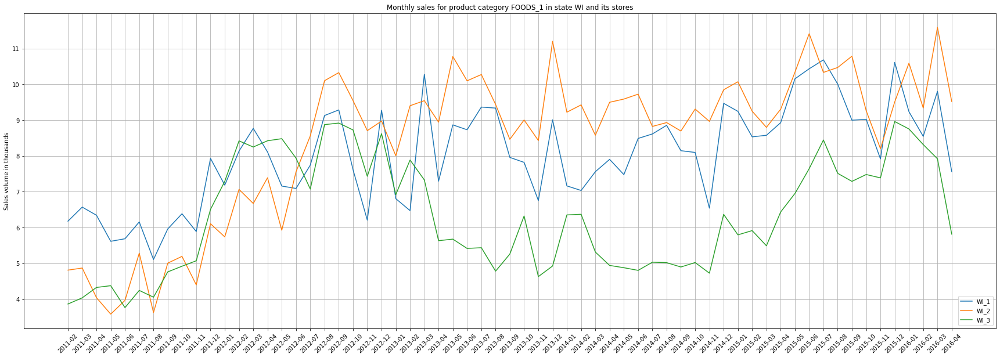

In [112]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_1','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_1','WI_3'].T/1000, label = 'WI_3')

            
plt.title('Monthly sales for product category FOODS_1 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

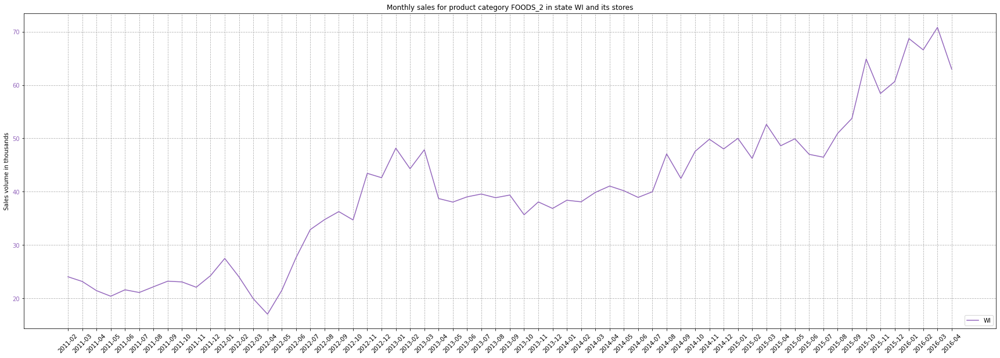

In [113]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_2','WI'].T/1000, color=color, label = 'WI')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_2 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

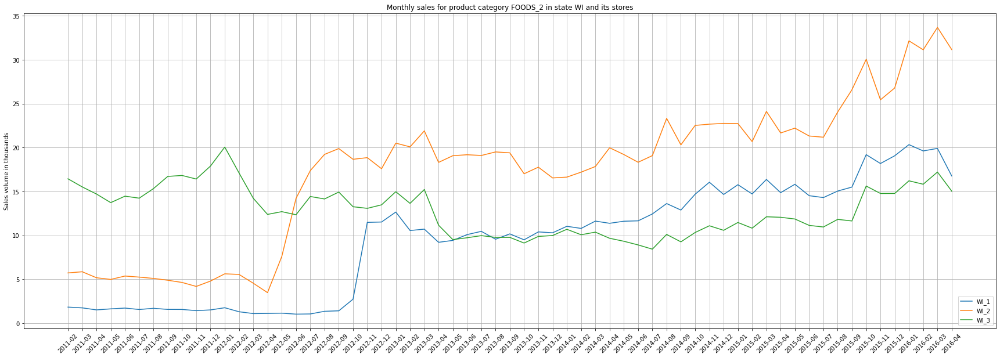

In [114]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_2','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_2','WI_3'].T/1000, label = 'WI_3')

            
plt.title('Monthly sales for product category FOODS_2 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

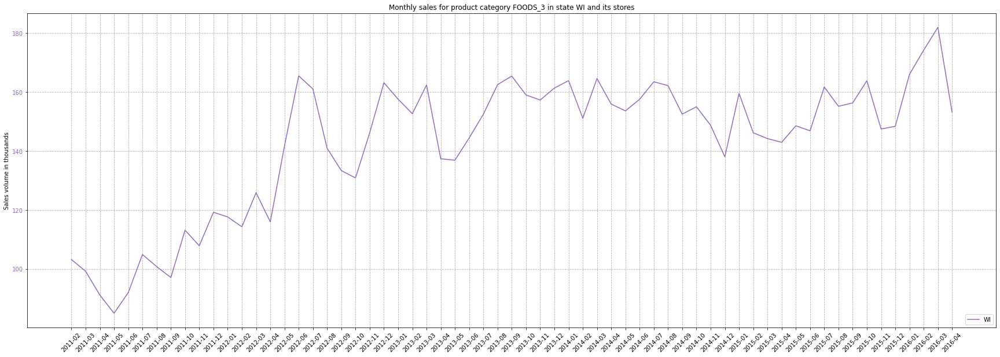

In [115]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['FOODS_3','WI'].T/1000, color=color, label = 'WI')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category FOODS_3 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

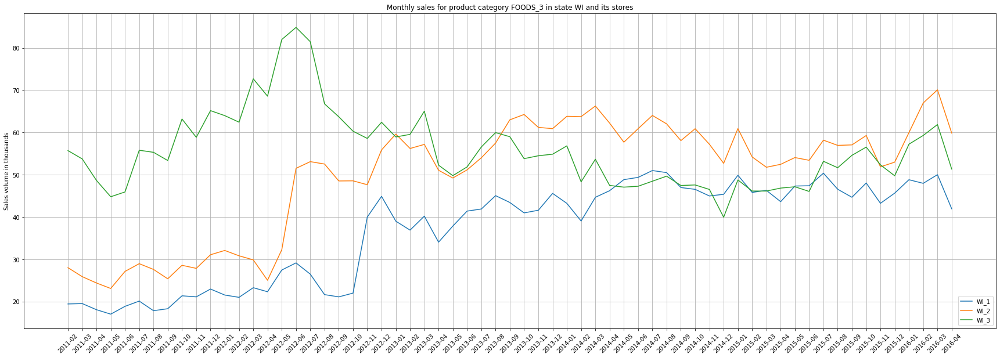

In [116]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['FOODS_3','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['FOODS_3','WI_3'].T/1000, label = 'WI_3')
            
plt.title('Monthly sales for product category FOODS_3 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

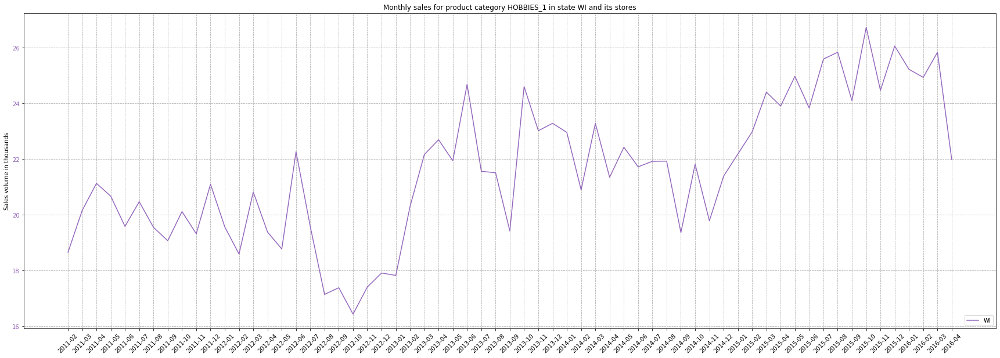

In [117]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOBBIES_1','WI'].T/1000, color=color, label = 'WI')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOBBIES_1 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

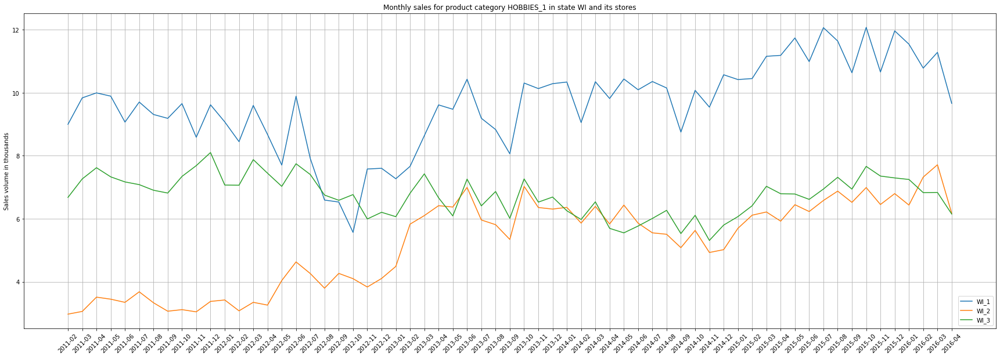

In [118]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_1','WI_3'].T/1000, label = 'WI_3')
            
plt.title('Monthly sales for product category HOBBIES_1 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

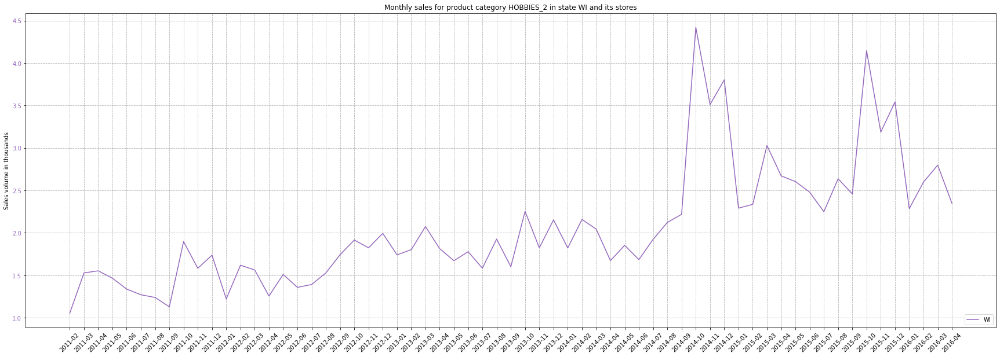

In [119]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOBBIES_2','WI'].T/1000, color=color, label = 'WI')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOBBIES_2 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

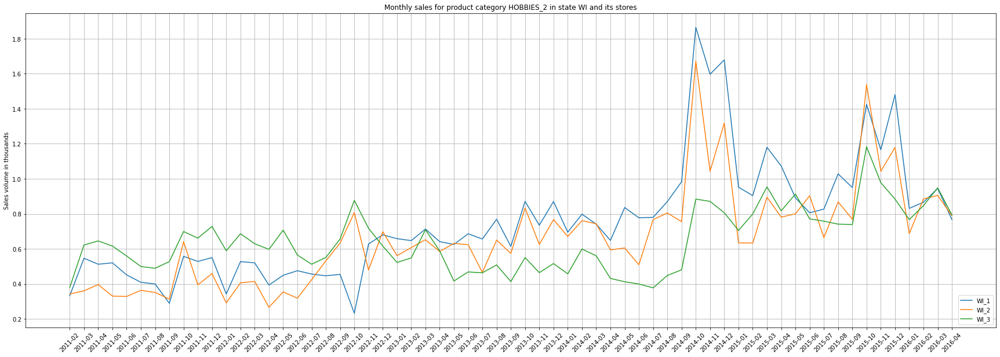

In [120]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['HOBBIES_2','WI_3'].T/1000, label = 'WI_3')
            
plt.title('Monthly sales for product category HOBBIES_2 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

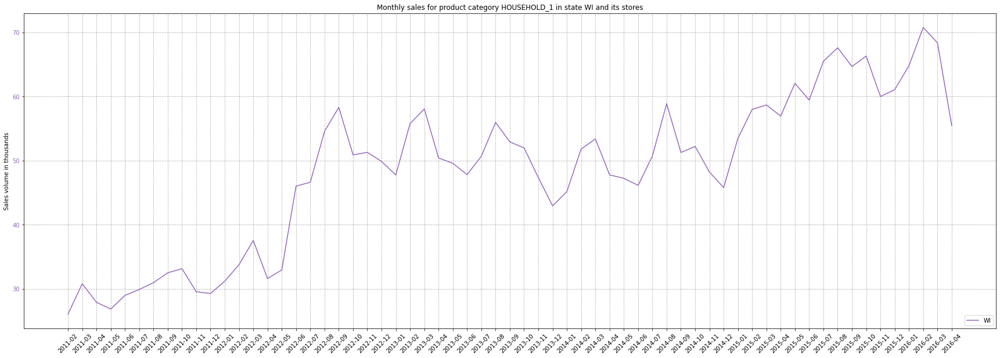

In [121]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_1','WI'].T/1000, color=color, label = 'WI')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOUSEHOLD_1 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

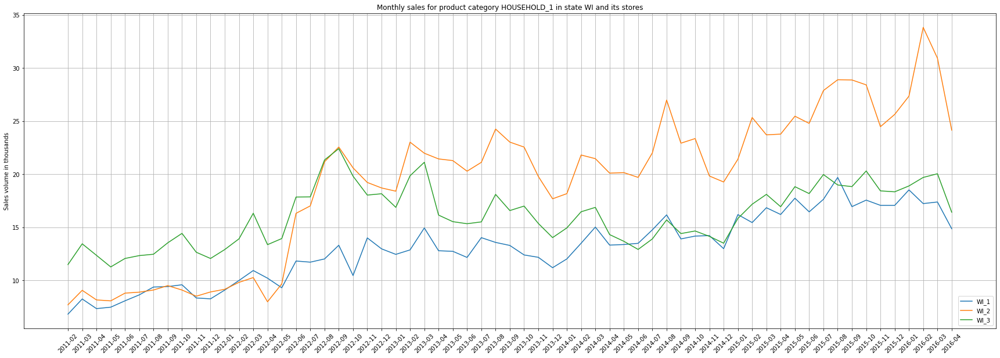

In [122]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_1','WI_3'].T/1000, label = 'WI_3')
            
plt.title('Monthly sales for product category HOUSEHOLD_1 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

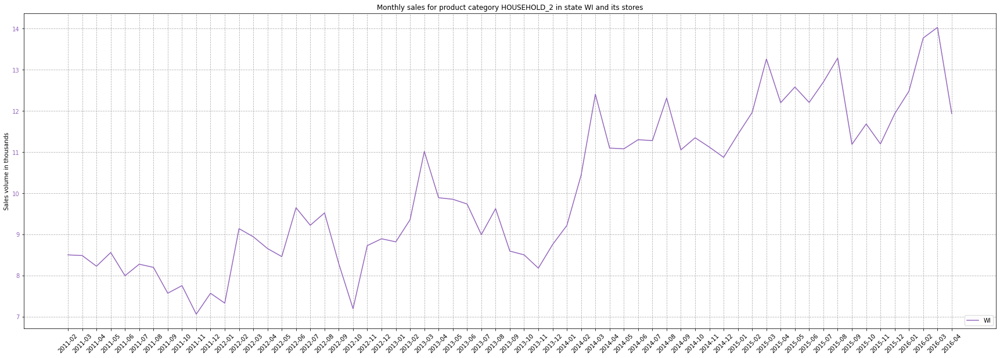

In [123]:
plt.figure(figsize=(30, 10))

color = 'tab:purple'
plt.plot(sv_mth_pdt_state.loc['HOUSEHOLD_2','WI'].T/1000, color=color, label = 'WI')
plt.tick_params(axis='y', labelcolor=color)
plt.grid(which='major', axis='both', linestyle='--')

            
plt.title('Monthly sales for product category HOUSEHOLD_2 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

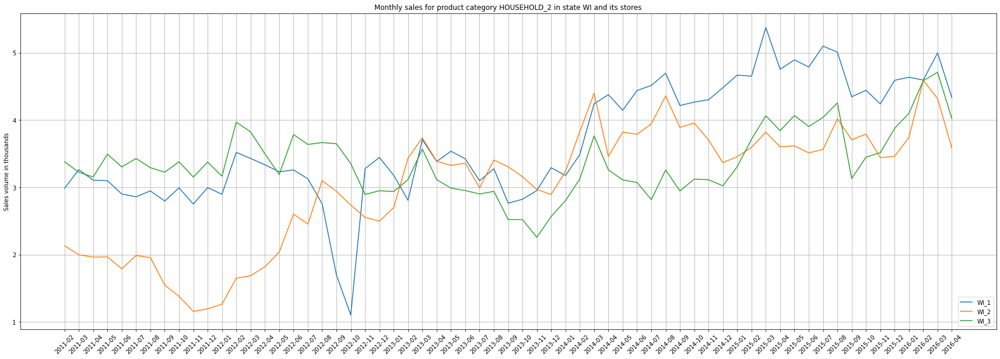

In [124]:
plt.figure(figsize=(30, 10))

plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','WI_1'].T/1000, label = 'WI_1')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','WI_2'].T/1000, label = 'WI_2')
plt.plot(sv_mth_pdt_store.loc['HOUSEHOLD_2','WI_3'].T/1000, label = 'WI_3')
            
plt.title('Monthly sales for product category HOUSEHOLD_2 in state WI and its stores')
plt.xticks(rotation=45)
plt.ylabel('Sales volume in thousands')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

#### WORK WEEK ANALYSIS

In [4]:
sv_stores=sv.groupby('store_id').sum().T
sv_stores.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1913 entries, d_1 to d_1913
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   CA_1    1913 non-null   int64
 1   CA_2    1913 non-null   int64
 2   CA_3    1913 non-null   int64
 3   CA_4    1913 non-null   int64
 4   TX_1    1913 non-null   int64
 5   TX_2    1913 non-null   int64
 6   TX_3    1913 non-null   int64
 7   WI_1    1913 non-null   int64
 8   WI_2    1913 non-null   int64
 9   WI_3    1913 non-null   int64
dtypes: int64(10)
memory usage: 164.4+ KB


In [5]:
stores = sv_stores.join(cal)
stores.columns

Index(['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1', 'WI_2',
       'WI_3', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'yrmth', 'event1', 'event2', 'events',
       'is_eventR', 'is_eventN', 'is_eventC', 'is_eventS', 'Xmas', 'TG', 'NY'],
      dtype='object')

In [6]:
stores['ttl_sales'] = stores.sum(axis=1)
stores.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1913 entries, d_1 to d_1913
Data columns (total 35 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   CA_1          1913 non-null   int64 
 1   CA_2          1913 non-null   int64 
 2   CA_3          1913 non-null   int64 
 3   CA_4          1913 non-null   int64 
 4   TX_1          1913 non-null   int64 
 5   TX_2          1913 non-null   int64 
 6   TX_3          1913 non-null   int64 
 7   WI_1          1913 non-null   int64 
 8   WI_2          1913 non-null   int64 
 9   WI_3          1913 non-null   int64 
 10  date          1913 non-null   object
 11  wm_yr_wk      1913 non-null   int64 
 12  weekday       1913 non-null   object
 13  wday          1913 non-null   int64 
 14  month         1913 non-null   int64 
 15  year          1913 non-null   int64 
 16  event_name_1  1913 non-null   object
 17  event_type_1  1913 non-null   object
 18  event_name_2  1913 non-null   object
 19  event_t

In [7]:

weekday_sales = stores.groupby('weekday').mean().filter(items = ['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1', 'WI_2',
       'WI_3'])
weekday_sales['ttl_sales'] = weekday_sales.sum(axis=1)
weekday_sales

,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,ttl_sales
weekday,,,,,,,,,,,
Friday,4022.582418,2985.996337,5573.282051,2092.725275,2804.205128,3708.227106,3110.402930,2861.311355,3559.556777,3507.695971,34225.985348
Monday,3853.578755,2620.098901,5882.446886,2176.714286,2806.963370,3657.630037,3184.633700,2308.813187,3230.150183,3131.937729,32852.967033
Saturday,5064.722628,3981.040146,6722.861314,2395.810219,3451.700730,4505.357664,3678.284672,3642.175182,3974.427007,4130.514599,41546.894161
Sunday,5129.744526,3808.335766,7039.007299,2460.916058,3661.901460,4624.875912,3780.302920,3137.113139,3613.996350,3873.828467,41130.021898
Thursday,3359.666667,2507.120879,5138.490842,1947.967033,2584.772894,3333.161172,2830.736264,2331.842491,3205.183150,2966.065934,30205.007326
Tuesday,3410.919414,2449.021978,5379.721612,1999.073260,2584.556777,3279.161172,2874.747253,2244.626374,3159.260073,2987.692308,30368.780220
Wednesday,3320.036630,2445.769231,5196.124542,1940.783883,2575.417582,3284.457875,2818.809524,2310.318681,3200.369963,2917.934066,30010.021978


In [56]:
### weekday sales in each store
storesname = stores.columns[:10]
for s in storesname :
    ss = stores.groupby(by=['weekday']).mean().filter(items=[s]).sort_values(by=[s])
    print(ss,'\n')

                  CA_1
weekday               
Wednesday  3320.036630
Thursday   3359.666667
Tuesday    3410.919414
Monday     3853.578755
Friday     4022.582418
Saturday   5064.722628
Sunday     5129.744526 

                  CA_2
weekday               
Wednesday  2445.769231
Tuesday    2449.021978
Thursday   2507.120879
Monday     2620.098901
Friday     2985.996337
Sunday     3808.335766
Saturday   3981.040146 

                  CA_3
weekday               
Thursday   5138.490842
Wednesday  5196.124542
Tuesday    5379.721612
Friday     5573.282051
Monday     5882.446886
Saturday   6722.861314
Sunday     7039.007299 

                  CA_4
weekday               
Wednesday  1940.783883
Thursday   1947.967033
Tuesday    1999.073260
Friday     2092.725275
Monday     2176.714286
Saturday   2395.810219
Sunday     2460.916058 

                  TX_1
weekday               
Wednesday  2575.417582
Tuesday    2584.556777
Thursday   2584.772894
Friday     2804.205128
Monday     2806.963370
Sat

In [58]:
### weekday sales in each store
storesname = stores.columns[:10]
for s in storesname :
    ss = stores.where((stores['event1']==0) & (stores['event2']==0)).groupby(by=['weekday']).mean().filter(items=[s]).sort_values(by=[s])
    print(ss,'\n')

                  CA_1
weekday               
Wednesday  3348.095238
Thursday   3384.817814
Tuesday    3423.735409
Monday     3826.915612
Friday     4041.920755
Saturday   5066.412879
Sunday     5236.303797 

                  CA_2
weekday               
Wednesday  2459.047619
Tuesday    2466.832685
Thursday   2521.858300
Monday     2566.919831
Friday     3000.792453
Sunday     3872.978903
Saturday   3983.867424 

                  CA_3
weekday               
Thursday   5172.425101
Wednesday  5243.154762
Tuesday    5404.357977
Friday     5599.822642
Monday     5848.991561
Saturday   6722.810606
Sunday     7149.101266 

                  CA_4
weekday               
Thursday   1956.886640
Wednesday  1960.285714
Tuesday    2010.505837
Friday     2103.094340
Monday     2178.413502
Saturday   2393.079545
Sunday     2500.556962 

                  TX_1
weekday               
Wednesday  2587.376984
Thursday   2587.987854
Tuesday    2591.521401
Monday     2784.379747
Friday     2815.558491
Sat

In [8]:
### weekday sales in each store
storesname = stores.columns[:10]
for s in storesname :
    ss = stores.where((stores['event1']==1) & (stores['event2']==0)).groupby(by=['weekday']).mean().filter(items=[s]).sort_values(by=[s])
    print(ss,'\n')

                  CA_1
weekday               
Wednesday  2983.333333
Thursday   3120.730769
Tuesday    3205.062500
Friday     3382.000000
Monday     4029.111111
Sunday     4434.909091
Saturday   5020.100000 

                  CA_2
weekday               
Tuesday    2162.937500
Wednesday  2286.428571
Thursday   2367.115385
Friday     2495.875000
Monday     2970.194444
Sunday     3406.757576
Saturday   3906.400000 

                  CA_3
weekday               
Wednesday  4631.761905
Friday     4694.125000
Thursday   4816.115385
Tuesday    4984.000000
Monday     6102.694444
Sunday     6302.969697
Saturday   6724.200000 

                  CA_4
weekday               
Wednesday  1706.761905
Friday     1749.250000
Tuesday    1815.437500
Thursday   1863.230769
Monday     2165.527778
Sunday     2208.272727
Saturday   2467.900000 

                  TX_1
weekday               
Friday     2428.125000
Wednesday  2431.904762
Tuesday    2472.687500
Thursday   2554.230769
Monday     2955.638889
Sun

In [9]:
### weekday sales in each store
storesname = stores.columns[:10]
for s in storesname :
    ss = stores.where((stores['snap_CA']==1) | (stores['snap_TX']==1) |(stores['snap_WI']==1)).groupby(by=['weekday']).mean().filter(items=[s]).sort_values(by=[s])
    print(ss,'\n')

                  CA_1
weekday               
Wednesday  3471.119403
Thursday   3535.462687
Tuesday    3578.408759
Monday     4040.179104
Friday     4168.992647
Saturday   5239.119403
Sunday     5270.080882 

                  CA_2
weekday               
Wednesday  2462.059701
Tuesday    2497.576642
Thursday   2548.776119
Monday     2649.940299
Friday     3025.323529
Sunday     3833.139706
Saturday   4022.119403 

                  CA_3
weekday               
Thursday   5443.582090
Wednesday  5492.156716
Tuesday    5673.963504
Friday     5839.058824
Monday     6192.388060
Saturday   6988.753731
Sunday     7275.183824 

                  CA_4
weekday               
Wednesday  1982.753731
Thursday   1989.686567
Tuesday    2039.985401
Friday     2125.257353
Monday     2224.679104
Saturday   2447.820896
Sunday     2506.742647 

                  TX_1
weekday               
Wednesday  2720.022388
Tuesday    2726.510949
Thursday   2730.373134
Monday     2948.268657
Friday     2956.698529
Sat

In [10]:
x=weekday_sales.index

In [11]:
y=weekday_sales.ttl_sales

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

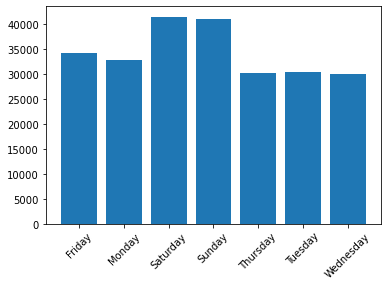

In [16]:
plt.bar(x, y)
plt.xticks(rotation = 45)

<AxesSubplot:xlabel='weekday'>

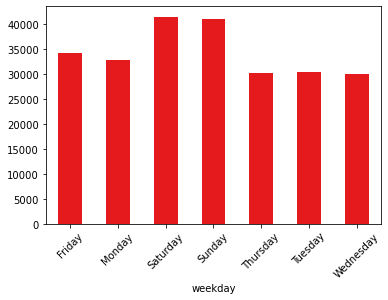

In [19]:
weekday_sales.ttl_sales.plot(kind = 'bar', rot = 45, colormap = 'Set1')

In [55]:
event1_sales = stores.groupby('event_name_1').mean().filter(items = ['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1', 'WI_2',
       'WI_3'])
event1_sales['ttl'] = event1_sales.sum(axis=1)
event1_sales.sort_values(by=['ttl'])

,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,ttl
event_name_1,,,,,,,,,,,
Christmas,0.000000,3.800000,2.400000,0.000000,0.400000,3.600000,2.800000,0.600000,1.400000,0.600000,15.600000
Thanksgiving,2200.600000,1415.800000,3482.800000,1332.800000,2520.400000,2921.000000,2085.800000,1290.000000,1468.600000,2412.200000,21130.000000
NewYear,2936.200000,2428.400000,4169.000000,1521.400000,2421.200000,3106.000000,2459.400000,2170.800000,2431.400000,2124.600000,25768.400000
LentWeek2,3151.333333,2455.166667,4923.333333,1822.833333,2552.833333,3260.333333,2885.166667,2372.166667,3375.833333,2948.000000,29747.000000
Halloween,3353.400000,2830.200000,4846.400000,2029.400000,2515.800000,3086.000000,2768.800000,2632.600000,3204.400000,2792.400000,30059.400000
LentStart,3173.666667,2442.333333,5112.500000,1883.166667,2679.000000,3544.666667,2870.833333,2288.000000,3527.333333,3205.500000,30727.000000
NBAFinalsStart,3332.600000,2522.000000,5555.400000,2096.600000,2806.600000,3630.800000,2948.600000,2426.600000,3493.400000,3061.800000,31874.400000
MemorialDay,4121.600000,3054.200000,5986.400000,2184.000000,2878.800000,3928.000000,3046.000000,2421.400000,2349.800000,2729.400000,32699.600000
Cinco De Mayo,3848.000000,2572.000000,5560.500000,2086.500000,3026.750000,3599.750000,3151.500000,2332.000000,3131.000000,3515.500000,32823.500000


In [50]:
### 3 events with lowest average sales in each store
storesname = stores.columns[:10]
for s in storesname :
    bottomevents = stores.groupby(by=['event_name_1']).mean().filter(items=[s]).sort_values(by=[s])
    print(bottomevents[:3],'\n')

                CA_1
event_name_1        
Christmas        0.0
Thanksgiving  2200.6
NewYear       2936.2 

                CA_2
event_name_1        
Christmas        3.8
Thanksgiving  1415.8
NewYear       2428.4 

                CA_3
event_name_1        
Christmas        2.4
Thanksgiving  3482.8
NewYear       4169.0 

                CA_4
event_name_1        
Christmas        0.0
Thanksgiving  1332.8
NewYear       1521.4 

                TX_1
event_name_1        
Christmas        0.4
NewYear       2421.2
Halloween     2515.8 

                TX_2
event_name_1        
Christmas        3.6
Thanksgiving  2921.0
Halloween     3086.0 

                TX_3
event_name_1        
Christmas        2.8
Thanksgiving  2085.8
NewYear       2459.4 

                WI_1
event_name_1        
Christmas        0.6
Thanksgiving  1290.0
NewYear       2170.8 

                WI_2
event_name_1        
Christmas        1.4
Thanksgiving  1468.6
MemorialDay   2349.8 

                WI_3
event_name_1    

In [51]:
### 3 events with highest average sales in each store
storesname = stores.columns[:10]
for s in storesname :
    topevents = stores.groupby(by=['event_name_1']).mean().filter(items=[s]).sort_values(by=[s], ascending=False)
    print(topevents[:3],'\n')

                       CA_1
event_name_1               
LaborDay        5092.000000
OrthodoxEaster  4873.250000
SuperBowl       4779.833333 

                CA_2
event_name_1        
Easter        4033.2
LaborDay      3781.4
Father's day  3562.5 

                CA_3
event_name_1        
LaborDay      7527.0
SuperBowl     6868.0
Easter        6732.2 

                     CA_4
event_name_1             
LaborDay      2526.600000
SuperBowl     2453.166667
Easter        2427.200000 

                     TX_1
event_name_1             
Easter        4355.200000
SuperBowl     3711.833333
Father's day  3706.000000 

                     TX_2
event_name_1             
LaborDay      4807.200000
Easter        4736.800000
SuperBowl     4732.666667 

                       TX_3
event_name_1               
SuperBowl       3982.333333
LaborDay        3864.800000
OrthodoxEaster  3589.500000 

                      WI_1
event_name_1              
EidAlAdha      3040.000000
LaborDay       2994.60000

#### WORK WEEK ANALYSIS - CA1

In [280]:
sv.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd_1',
       'd_2', 'd_3', 'd_4',
       ...
       'd_1904', 'd_1905', 'd_1906', 'd_1907', 'd_1908', 'd_1909', 'd_1910',
       'd_1911', 'd_1912', 'd_1913'],
      dtype='object', length=1919)

In [123]:
ww = sv.where(sv['store_id']=='CA_1').groupby('store_id').sum().T
ww

store_id,CA_1
d_1,4337.0
d_2,4155.0
d_3,2816.0
d_4,3051.0
d_5,2630.0
...,...
d_1909,3722.0
d_1910,3709.0
d_1911,4387.0
d_1912,5577.0


In [125]:
ww.index

Index(['d_1', 'd_2', 'd_3', 'd_4', 'd_5', 'd_6', 'd_7', 'd_8', 'd_9', 'd_10',
       ...
       'd_1904', 'd_1905', 'd_1906', 'd_1907', 'd_1908', 'd_1909', 'd_1910',
       'd_1911', 'd_1912', 'd_1913'],
      dtype='object', length=1913)

In [126]:
ww.index.rename('int_day', inplace=True)

In [127]:
ww_cal=ww.join(cal)

In [128]:
ww_cal

,CA_1,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,...,snap_TX,snap_WI,event1,event2,events,is_eventR,is_eventN,is_eventC,is_eventS,yrmth
int_day,,,,,,,,,,,,,,,,,,,,,
d_1,4337.0,2011-01-29,11101,Saturday,1,1,2011,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,2011-01
d_2,4155.0,2011-01-30,11101,Sunday,2,1,2011,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,2011-01
d_3,2816.0,2011-01-31,11101,Monday,3,1,2011,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,2011-01
d_4,3051.0,2011-02-01,11101,Tuesday,4,2,2011,nil,nil,nil,...,1,0,0,0,0,0,0,0,0,2011-02
d_5,2630.0,2011-02-02,11101,Wednesday,5,2,2011,nil,nil,nil,...,0,1,0,0,0,0,0,0,0,2011-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d_1909,3722.0,2016-04-20,11612,Wednesday,5,4,2016,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,2016-04
d_1910,3709.0,2016-04-21,11612,Thursday,6,4,2016,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,2016-04
d_1911,4387.0,2016-04-22,11612,Friday,7,4,2016,nil,nil,nil,...,0,0,0,0,0,0,0,0,0,2016-04


In [194]:
ww_cal.groupby('snap_CA').mean()

,CA_1,wm_yr_wk,wday,month,year,snap_TX,snap_WI,event1,event2,events,is_eventR,is_eventN,is_eventC,is_eventS
snap_CA,,,,,,,,,,,,,,
0,3897.100546,11339.434918,3.996882,6.369447,2013.202650,0.196415,0.196415,0.079501,0.002338,0.002338,0.026500,0.026500,0.021044,0.005456
1,4282.914286,11338.695238,3.998413,6.333333,2013.222222,0.600000,0.600000,0.082540,0.001587,0.001587,0.028571,0.026984,0.012698,0.014286


In [188]:
ww_cal.groupby('event1').mean()

,CA_1,wm_yr_wk,wday,month,year,snap_CA,snap_TX,snap_WI,event2,events,is_eventR,is_eventN,is_eventC,is_eventS
event1,,,,,,,,,,,,,,
0,4045.648096,11339.216600,4.021603,6.428653,2013.205230,0.328596,0.327459,0.328596,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,3778.707792,11338.902597,3.720779,5.545455,2013.253247,0.337662,0.350649,0.337662,0.025974,0.025974,0.337662,0.331169,0.227273,0.103896


In [189]:
ww_cal.groupby('events').mean()

,CA_1,wm_yr_wk,wday,month,year,snap_CA,snap_TX,snap_WI,event1,event2,is_eventR,is_eventN,is_eventC,is_eventS
events,,,,,,,,,,,,,,
0,4023.060241,11339.242012,4.001572,6.360922,2013.209534,0.329492,0.328968,0.328968,0.078575,0.0,0.026192,0.026716,0.01781,0.007858
1,4548.500000,11315.000000,2.000000,4.750000,2013.000000,0.250000,0.500000,0.500000,1.000000,1.0,0.500000,0.000000,0.25000,0.250000


In [190]:
ww_cal.groupby('is_eventR').mean()

,CA_1,wm_yr_wk,wday,month,year,snap_CA,snap_TX,snap_WI,event1,event2,events,is_eventN,is_eventC,is_eventS
is_eventR,,,,,,,,,,,,,,
0,4027.531435,11339.250940,3.997851,6.390650,2013.207953,0.328855,0.328318,0.329930,0.054809,0.001075,0.001075,0.027405,0.018807,0.008598
1,3903.461538,11337.057692,3.980769,5.173077,2013.250000,0.346154,0.365385,0.307692,1.000000,0.038462,0.038462,0.000000,0.000000,0.000000


In [191]:
ww_cal.groupby('is_eventN').mean()

,CA_1,wm_yr_wk,wday,month,year,snap_CA,snap_TX,snap_WI,event1,event2,events,is_eventR,is_eventC,is_eventS
is_eventN,,,,,,,,,,,,,,
0,4039.348013,11339.175081,4.000000,6.345328,2013.207841,0.329216,0.329216,0.331901,0.055317,0.002148,0.002148,0.027927,0.018797,0.008593
1,3469.607843,11339.784314,3.901961,6.803922,2013.254902,0.333333,0.333333,0.235294,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [192]:
ww_cal.groupby('is_eventC').mean()

,CA_1,wm_yr_wk,wday,month,year,snap_CA,snap_TX,snap_WI,event1,event2,events,is_eventR,is_eventN,is_eventS
is_eventC,,,,,,,,,,,,,,
0,4026.202343,11339.107029,4.013845,6.387114,2013.207668,0.331203,0.331203,0.327476,0.063365,0.001597,0.001597,0.027689,0.027157,0.00852
1,3914.514286,11343.714286,3.114286,4.771429,2013.285714,0.228571,0.228571,0.428571,1.000000,0.028571,0.028571,0.000000,0.000000,0.00000


In [193]:
ww_cal.groupby('is_eventS').mean()

,CA_1,wm_yr_wk,wday,month,year,snap_CA,snap_TX,snap_WI,event1,event2,events,is_eventR,is_eventN,is_eventC
is_eventS,,,,,,,,,,,,,,
0,4023.844491,11339.255667,4.000527,6.373748,2013.209278,0.327359,0.326832,0.327359,0.072746,0.001581,0.001581,0.027412,0.026885,0.01845
1,4061.437500,11331.562500,3.625000,4.437500,2013.187500,0.562500,0.625000,0.562500,1.000000,0.062500,0.062500,0.000000,0.000000,0.00000


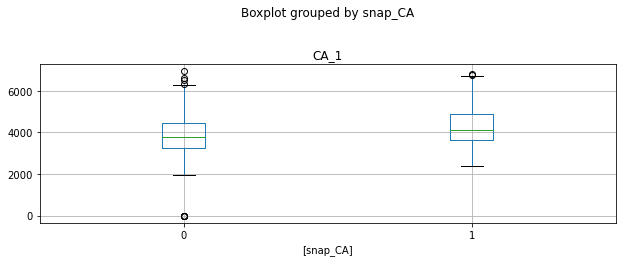

In [143]:
bp1 = ww_cal.boxplot(column=['CA_1'],by=['snap_CA'],figsize=[10,10], layout=(3,1), rot=True)
                                                            

In [178]:
tmp=ww_cal.groupby(by=['wm_yr_wk']).sum()
tmp.fillna(0)


,CA_1,wday,month,year,snap_CA,snap_TX,snap_WI,event1,event2,events,is_eventR,is_eventN,is_eventC,is_eventS
wm_yr_wk,,,,,,,,,,,,,,
11101,23715.0,28,11,14077,4,2,2,0,0,0,0,0,0,0
11102,24645.0,28,14,14077,6,5,5,1,0,0,0,0,0,1
11103,21153.0,28,14,14077,0,3,3,1,0,0,0,0,1,0
11104,21716.0,28,14,14077,0,0,0,1,0,0,0,1,0,0
11105,20167.0,28,18,14077,4,2,2,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11609,30899.0,28,22,14112,1,1,0,1,0,0,0,0,1,0
11610,33586.0,28,28,14112,7,4,5,0,0,0,0,0,0,0
11611,31241.0,28,28,14112,2,5,5,0,0,0,0,0,0,0


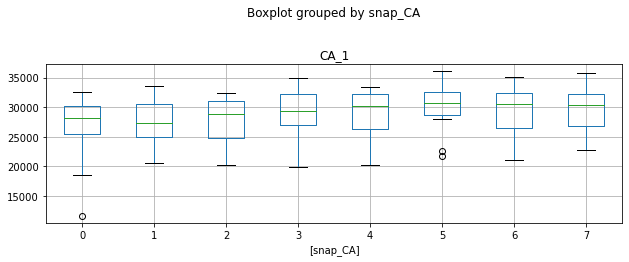

In [171]:
bp2 = tmp.boxplot(column=['CA_1'],by=['snap_CA'],figsize=[10,10], layout=(3,1), rot=True)

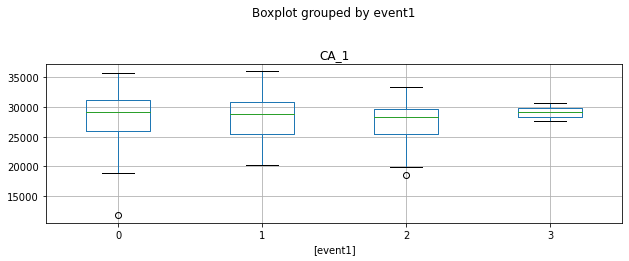

In [182]:
bp2 = tmp.boxplot(column=['CA_1'],by=['event1'],figsize=[10,10], layout=(3,1), rot=True)

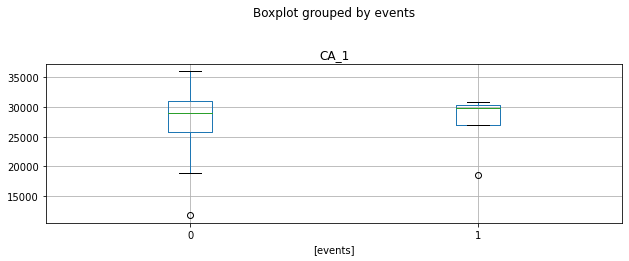

In [183]:
bp2 = tmp.boxplot(column=['CA_1'],by=['events'],figsize=[10,10], layout=(3,1), rot=True)

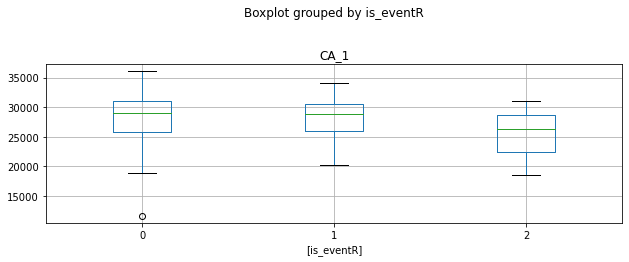

In [184]:
bp2 = tmp.boxplot(column=['CA_1'],by=['is_eventR'],figsize=[10,10], layout=(3,1), rot=True)

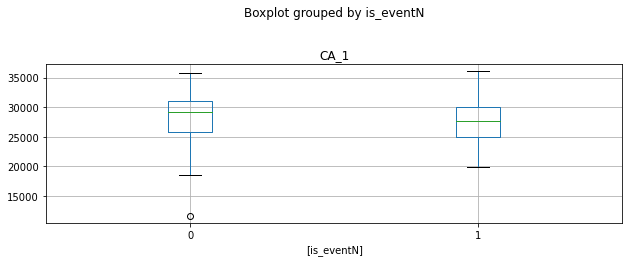

In [185]:
bp2 = tmp.boxplot(column=['CA_1'],by=['is_eventN'],figsize=[10,10], layout=(3,1), rot=True)

In [176]:
tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 274 entries, 11101 to 11613
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   CA_1       274 non-null    float64
 1   wday       274 non-null    int64  
 2   month      274 non-null    int64  
 3   year       274 non-null    int64  
 4   snap_CA    274 non-null    int64  
 5   snap_TX    274 non-null    int64  
 6   snap_WI    274 non-null    int64  
 7   event1     274 non-null    int64  
 8   event2     274 non-null    int64  
 9   events     274 non-null    int64  
 10  is_eventR  274 non-null    int64  
 11  is_eventN  274 non-null    int64  
 12  is_eventC  274 non-null    int64  
 13  is_eventS  274 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 32.1 KB


In [180]:
ww_CA1 = tmp.filter(items =['CA_1','snap_CA'])
ww_CA1.index

Int64Index([11101, 11102, 11103, 11104, 11105, 11106, 11107, 11108, 11109,
            11110,
            ...
            11604, 11605, 11606, 11607, 11608, 11609, 11610, 11611, 11612,
            11613],
           dtype='int64', name='wm_yr_wk', length=274)

In [181]:
ww_CA1.to_excel('ww_CA1.xlsx', index_label='wm_yr_wk')

### Events analysis

In [36]:
cal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1969 entries, d_1 to d_1969
Data columns (total 21 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          1969 non-null   object
 1   wm_yr_wk      1969 non-null   int64 
 2   weekday       1969 non-null   object
 3   wday          1969 non-null   int64 
 4   month         1969 non-null   int64 
 5   year          1969 non-null   int64 
 6   event_name_1  1969 non-null   object
 7   event_type_1  1969 non-null   object
 8   event_name_2  1969 non-null   object
 9   event_type_2  1969 non-null   object
 10  snap_CA       1969 non-null   int64 
 11  snap_TX       1969 non-null   int64 
 12  snap_WI       1969 non-null   int64 
 13  yrmth         1969 non-null   object
 14  event1        1969 non-null   int64 
 15  event2        1969 non-null   int64 
 16  events        1969 non-null   int64 
 17  is_eventR     1969 non-null   int64 
 18  is_eventN     1969 non-null   int64 
 19  is_even

In [26]:
cal.head()

,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,...,snap_TX,snap_WI,yrmth,event1,event2,events,is_eventR,is_eventN,is_eventC,is_eventS
int_day,,,,,,,,,,,,,,,,,,,,,
d_1,2011-01-29,11101,Saturday,1,1,2011,nil,nil,nil,nil,...,0,0,2011-01,0,0,0,0,0,0,0
d_2,2011-01-30,11101,Sunday,2,1,2011,nil,nil,nil,nil,...,0,0,2011-01,0,0,0,0,0,0,0
d_3,2011-01-31,11101,Monday,3,1,2011,nil,nil,nil,nil,...,0,0,2011-01,0,0,0,0,0,0,0
d_4,2011-02-01,11101,Tuesday,4,2,2011,nil,nil,nil,nil,...,1,0,2011-02,0,0,0,0,0,0,0
d_5,2011-02-02,11101,Wednesday,5,2,2011,nil,nil,nil,nil,...,0,1,2011-02,0,0,0,0,0,0,0


In [76]:
tmp=cal.where(cal['snap_CA'] == 1).filter(items = ['date','weekday','month']).dropna()

In [77]:
tmp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 650 entries, d_4 to d_1960
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   date     650 non-null    object 
 1   weekday  650 non-null    object 
 2   month    650 non-null    float64
dtypes: float64(1), object(2)
memory usage: 20.3+ KB


In [78]:
tmp['month'].unique()

array([ 2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,  1.])

In [80]:
day = []
for x in range(len(tmp)) :
    tmp_date = tmp['date'][x].split('-')
    tmp_day = tmp_date[2]
    day.append(tmp_day)

tmp['day'] = day
tmp

,date,weekday,month,day
int_day,,,,
d_4,2011-02-01,Tuesday,2.0,01
d_5,2011-02-02,Wednesday,2.0,02
d_6,2011-02-03,Thursday,2.0,03
d_7,2011-02-04,Friday,2.0,04
d_8,2011-02-05,Saturday,2.0,05
...,...,...,...,...
d_1956,2016-06-06,Monday,6.0,06
d_1957,2016-06-07,Tuesday,6.0,07
d_1958,2016-06-08,Wednesday,6.0,08


In [81]:
tmp['day'].value_counts()

03    65
09    65
07    65
05    65
02    65
01    65
04    65
06    65
08    65
10    65
Name: day, dtype: int64

In [83]:
cal[1913:]

,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,...,snap_TX,snap_WI,yrmth,event1,event2,events,is_eventR,is_eventN,is_eventC,is_eventS
int_day,,,,,,,,,,,,,,,,,,,,,
d_1914,2016-04-25,11613,Monday,3,4,2016,nil,nil,nil,nil,...,0,0,2016-04,0,0,0,0,0,0,0
d_1915,2016-04-26,11613,Tuesday,4,4,2016,nil,nil,nil,nil,...,0,0,2016-04,0,0,0,0,0,0,0
d_1916,2016-04-27,11613,Wednesday,5,4,2016,nil,nil,nil,nil,...,0,0,2016-04,0,0,0,0,0,0,0
d_1917,2016-04-28,11613,Thursday,6,4,2016,nil,nil,nil,nil,...,0,0,2016-04,0,0,0,0,0,0,0
d_1918,2016-04-29,11613,Friday,7,4,2016,nil,nil,nil,nil,...,0,0,2016-04,0,0,0,0,0,0,0
d_1919,2016-04-30,11614,Saturday,1,4,2016,Pesach End,Religious,nil,nil,...,0,0,2016-04,1,0,0,1,0,0,0
d_1920,2016-05-01,11614,Sunday,2,5,2016,OrthodoxEaster,Religious,nil,nil,...,1,0,2016-05,1,0,0,1,0,0,0
d_1921,2016-05-02,11614,Monday,3,5,2016,nil,nil,nil,nil,...,0,1,2016-05,0,0,0,0,0,0,0
d_1922,2016-05-03,11614,Tuesday,4,5,2016,nil,nil,nil,nil,...,1,1,2016-05,0,0,0,0,0,0,0
